The Matching Pursuit algorithm is popular in signal processing and applies well to digital images.

I have contributed a [python implementation](https://github.com/bicv/SparseEdges) and we will show here how we may use that for extracting a sparse set of edges from an image.

<BR>
<center><video controls autoplay loop src="../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4" width=61.8%/> </center>
<BR>

* this will be exposed in the following book chapter (see also https://laurentperrinet.github.io/publication/perrinet-15-bicv ), to be published by the end of this year:

```bibtex
@inbook{Perrinet15bicv,
    title = {Sparse models},
    author = {Perrinet, Laurent U.},
    booktitle = {Biologically-inspired Computer Vision},
    chapter = {13},
    editor = {Keil, Matthias and Crist\'{o}bal, Gabriel and Perrinet, Laurent U.},
    publisher = {Wiley, New-York},
    year = {2015}
}
```

<!-- TEASER_END -->

### setting things up

We will take some "baby steps first to show how it works, and then apply that to an image .

At first, we will define the [SparseEdges](https://github.com/bicv/SparseEdges) framework which will create the necessary processing steps, from the raw image, to creating the multi-resolution scheme and the Matching Pursuit algorithm:

In [1]:
from SparseEdges import SparseEdges
mp = SparseEdges('https://raw.githubusercontent.com/bicv/SparseEdges/master/default_param.py')
mp.pe.N = 4
mp.pe.do_mask = False
mp.pe.MP_alpha = 1.
mp.pe.do_whitening = False

This defines the following set of parameters:

In [2]:
print('Default parameters: ', mp.pe)

Default parameters:  {'verbose': 0, 'N_image': None, 'seed': 42, 'N_X': 256, 'N_Y': 256, 'noise': 0.33, 'do_mask': False, 'mask_exponent': 3.0, 'do_whitening': False, 'white_name_database': 'kodakdb', 'white_n_learning': 0, 'white_N': 0.07, 'white_N_0': 0.0, 'white_f_0': 0.4, 'white_alpha': 1.4, 'white_steepness': 4.0, 'white_recompute': False, 'base_levels': 1.618, 'n_theta': 24, 'B_sf': 0.4, 'B_theta': 0.17453277777777776, 'N': 4, 'MP_alpha': 1.0, 'd_width': 45.0, 'd_min': 0.5, 'd_max': 2.0, 'N_r': 6, 'N_Dtheta': 24, 'N_phi': 12, 'N_scale': 5, 'loglevel_max': 7, 'edge_mask': True, 'do_rank': False, 'scale_invariant': True, 'multiscale': True, 'kappa_phase': 0.0, 'weight_by_distance': True, 'svm_n_jobs': 1, 'svm_test_size': 0.2, 'N_svm_grid': 32, 'N_svm_cv': 50, 'C_range_begin': -5, 'C_range_end': 10.0, 'gamma_range_begin': -14, 'gamma_range_end': 3, 'svm_KL_m': 0.34, 'svm_tol': 0.001, 'svm_max_iter': -1, 'svm_log': False, 'svm_norm': False, 'figpath': 'results', 'do_edgedir': False, 

The useful imports for a nice notebook:

In [3]:
import matplotlib
matplotlib.rcParams.update({'text.usetex': False})
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt

import numpy as np
np.set_printoptions(precision=4)#, suppress=True)

fig_width = 14

In [4]:
print('Range of spatial frequencies: ', mp.sf_0)

Range of spatial frequencies:  [0.4545 0.2935 0.1895 0.1224 0.079  0.051  0.0329 0.0213 0.0137 0.0089
 0.0057]


In [5]:
print('Range of angles (in degrees): ', mp.theta*180./np.pi)

Range of angles (in degrees):  [-82.5 -75.  -67.5 -60.  -52.5 -45.  -37.5 -30.  -22.5 -15.   -7.5   0.
   7.5  15.   22.5  30.   37.5  45.   52.5  60.   67.5  75.   82.5  90. ]


### testing one step of (Matching + Pursuit)

Here, we will synthesize an image using 2 [log-Gabor](https://github.com/bicv/LogGabor/) filters and check that they are correctly retrieved using a few Matching Pursuit steps. An edge will be represented by a ``nd.array`` with respectively ``[x position, y center position, indice of angle in multi resolution, index of scale in multi resolution scheme]`` and a coefficient (a complex number whose argument determines the phase of the log-Gabor filter):

In [6]:
# one
edge_in, C_in= [3*mp.pe.N_X/4, mp.pe.N_Y/2, 2, 2], 42
# the second
edge_bis, C_bis = [mp.pe.N_X/8, mp.pe.N_Y/4, 8, 4], 4.*np.sqrt(2)*np.exp(1j*np.pi/4.)

Which results in

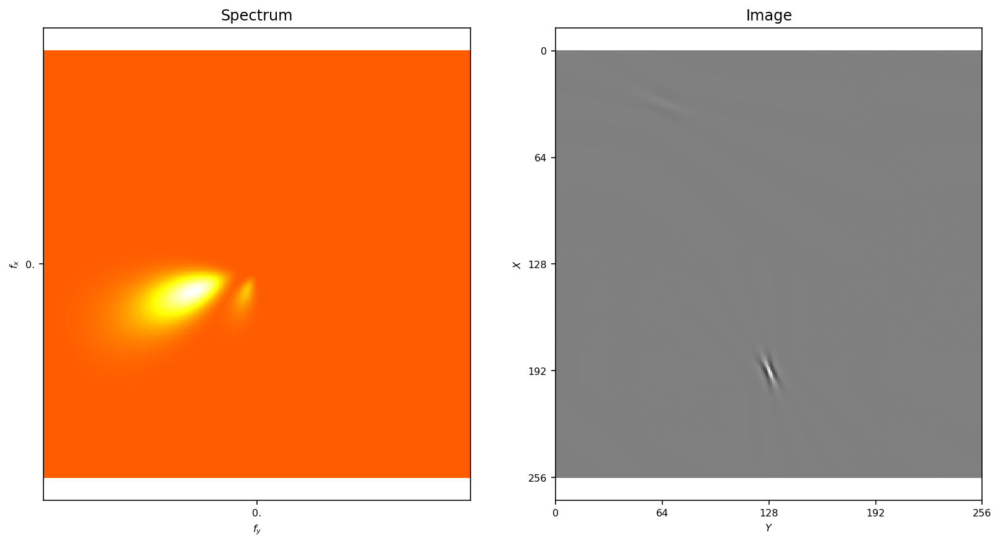

In [7]:
# filters in Fourier space
FT_lg_in = mp.loggabor(edge_in[0], edge_in[1], sf_0=mp.sf_0[edge_in[3]],
                         B_sf=mp.pe.B_sf, theta= mp.theta[edge_in[2]], B_theta=mp.pe.B_theta)
FT_lg_bis = mp.loggabor(edge_bis[0], edge_bis[1], sf_0=mp.sf_0[edge_bis[3]],
                         B_sf=mp.pe.B_sf, theta= mp.theta[edge_bis[2]], B_theta=mp.pe.B_theta)
# mixing both and shows one
FT_lg_ = C_in *  FT_lg_in + C_bis * FT_lg_bis
image = mp.invert(FT_lg_)

_ = mp.show_FT(FT_lg_, axis=True)

We may start by computing the linear coefficients in the multi resolution scheme

In [8]:
C = mp.linear_pyramid(image)

These coefficients correspond to a measure of how well the image matches with the filters in the multi-resolution scheme. These will be used in the **Matching** step.
We then detect the best match corresponding to the coefficient with maximum absolute activity:

In [9]:
edge_star = mp.argmax(C)
print('Coordinates of the maximum ', edge_star, ', true value: ', edge_in)
print('Value of the maximum ', C[edge_star], ', true value: ', C_in)

Coordinates of the maximum  (192, 128, 2, 2) , true value:  [192.0, 128.0, 2, 2]
Value of the maximum  (41.99999999999932+4.213693403441275e-13j) , true value:  42


At this particular orientation and scale, the absolute activity looks like:

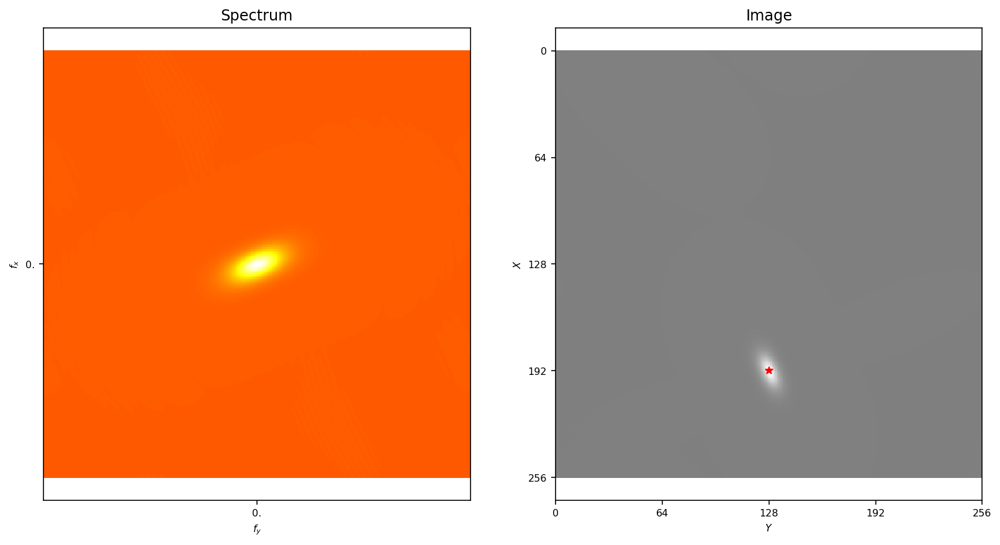

In [10]:
fig, a1, a2 = mp.show_spectrum(np.absolute(C[:, :, edge_star[2], edge_star[3]]), axis=True)
_ = a2.plot([edge_star[1]], [edge_star[0]], 'r*')

On our image, this looks like:

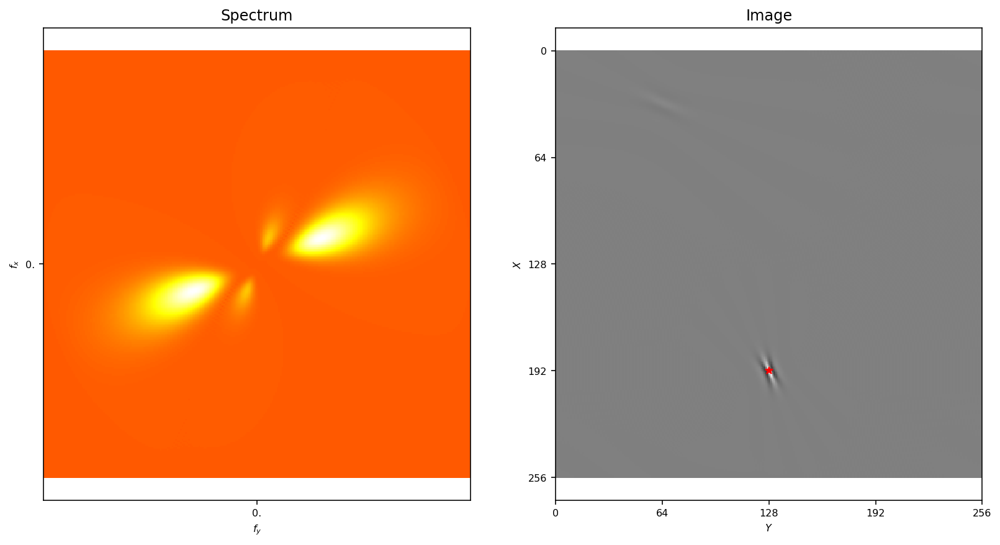

In [11]:
fig, a1, a2 = mp.show_spectrum(image, axis=True)
_ = a2.plot([edge_star[1]], [edge_star[0]], 'r*')

Let's now extract and show the "winner" of the **Matching** Step:

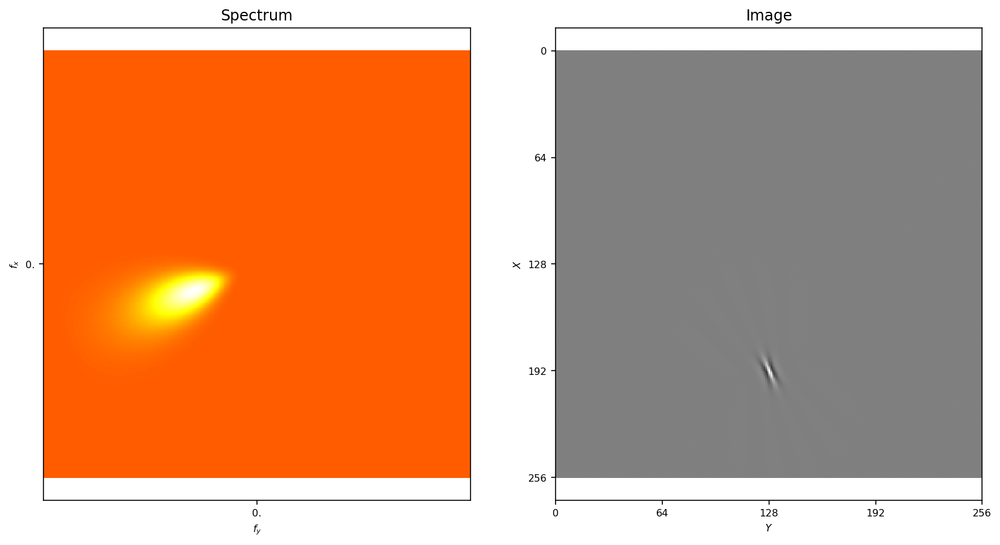

In [12]:
FT_star = mp.loggabor(edge_star[0], edge_star[1], sf_0=mp.sf_0[edge_star[3]],
                         B_sf=mp.pe.B_sf, theta= mp.theta[edge_star[2]], B_theta=mp.pe.B_theta)
im_star = mp.invert(FT_star)
_ = mp.show_FT(FT_star, axis=True)

Great, it looks like we have extracted the first edge. Let's first check that the energy of
 - the sum the extracted component  energy, 
 - maximum of its power spectrum (equivalent to the above, but we just check),
 - half the mean spectrum energy (half? rememeber the trick used in Log-Gabor filters)
are all equal to one:

In [13]:
print(np.sum(im_star**2), mp.FTfilter(im_star, FT_star).max(), np.mean(np.abs(FT_star)**2)/2)

1.0000000000000002 1.0000000000000004 1.0000000000000004


Let's overlay the extracted edge on the image:

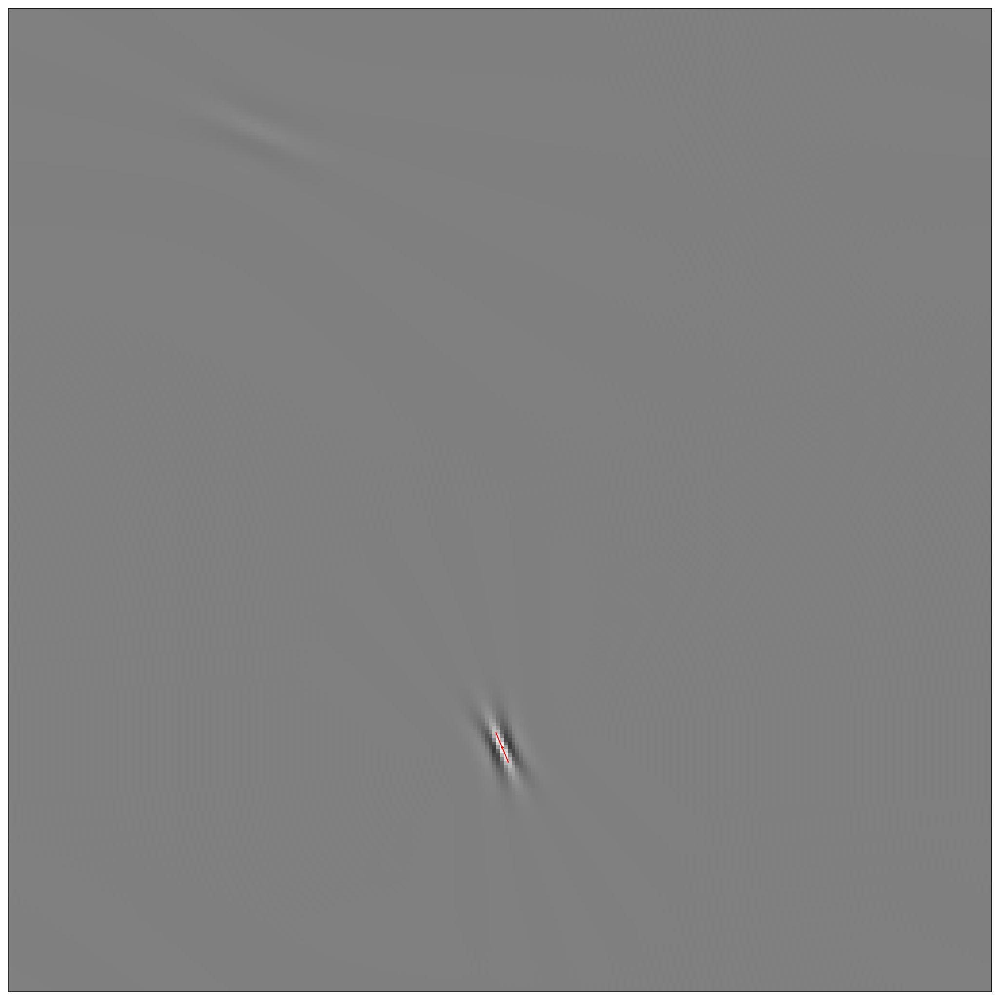

In [14]:
edge_star_in = np.array([edge_star[0], edge_star[1], mp.theta[edge_in[2]], mp.sf_0[edge_star[3]], np.absolute(C[edge_star]), np.angle(C[edge_star])])
mp.pe.figsize_edges = 9
fig, a = mp.show_edges(edge_star_in[:, np.newaxis], image=image)

Now, we may substract the residual from the image, it is the **Pursuit** step:

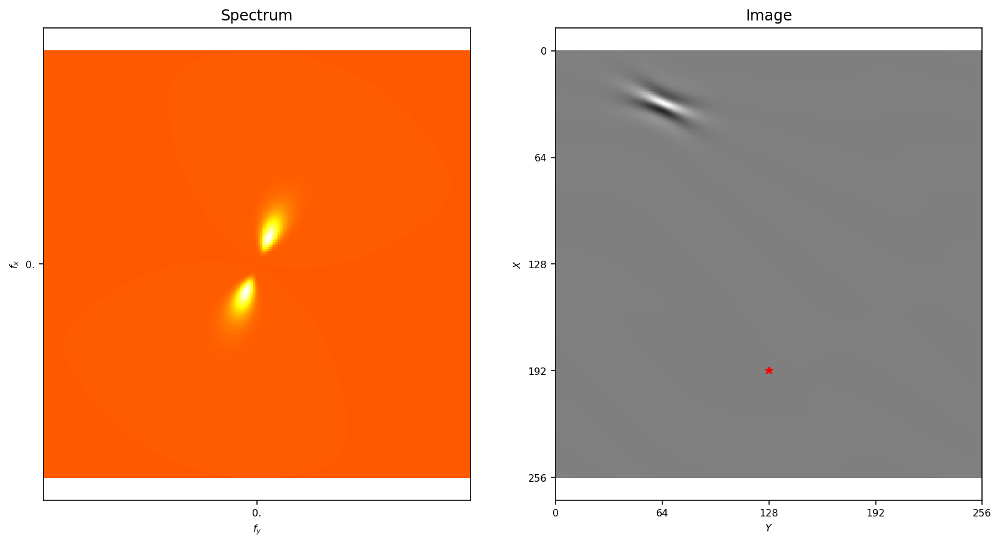

In [15]:
image_res = (image - C[edge_star] * im_star).real 
fig, a1, a2 = mp.show_spectrum(image_res, axis=True)
_ = a2.plot([edge_star[1]], [edge_star[0]], 'r*')

Looks pretty clear now that only the second edge remains.
We may now repeat another **Matching** step on the residual image:

In [16]:
C = mp.linear_pyramid(image_res)
edge_star_bis = mp.argmax(C)
print('Coordinates of the maximum ', edge_star_bis, ', true value: ', edge_bis)
print('Value of the maximum ', C[edge_star_bis], ', true value: ', C_bis)

Coordinates of the maximum  (32, 64, 8, 4) , true value:  [32.0, 64.0, 8, 4]
Value of the maximum  (4+4.000000000000005j) , true value:  (4.000000000000001+4j)


Note: to store the complex value of the coefficient, we use the fact that it is easy to transform a complex number to 2 reals and back:

In [17]:
z = np.sqrt(2)*np.exp(1j*np.pi/4.)
z_, z_p = np.absolute(z), np.angle(z)
print(z, z_*np.exp(1j*z_p))

(1.0000000000000002+1j) (1.0000000000000002+1j)


Note that the linear coefficients corresponding to the first winning filter are canceled:

In [18]:
print('Value of the residual ', C[edge_star], ', initial value: ', C_in)

Value of the residual  (-1.1652065246228562e-14+5.182340906836718e-13j) , initial value:  42


Let's overlay the extracted edge on the image:

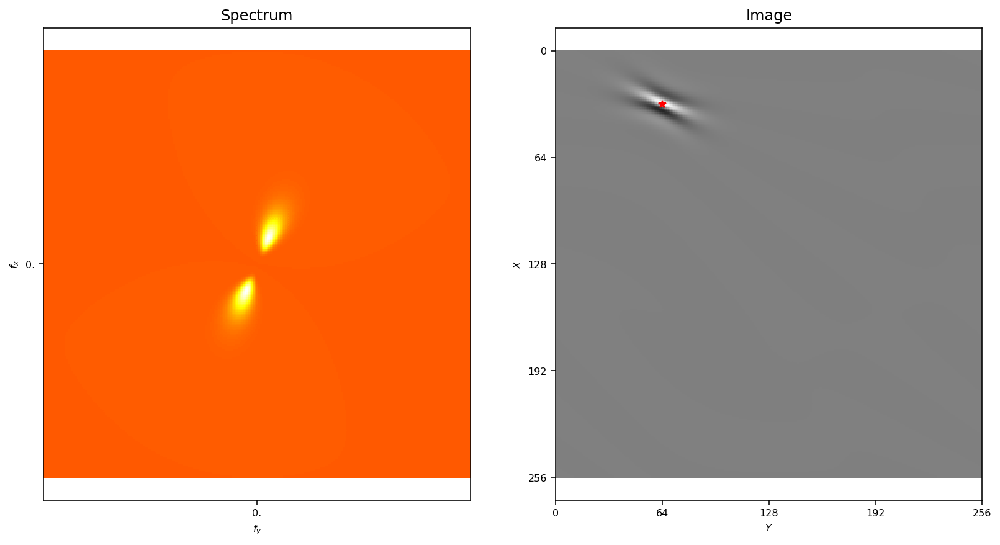

In [19]:
fig, a1, a2 = mp.show_spectrum(image_res, axis=True)
_ = a2.plot([edge_star_bis[1]], [edge_star_bis[0]], 'r*')

We have well extracted the two edges:

[[ 1.9200e+02  1.2800e+02 -1.1781e+00  1.8950e-01  4.2000e+01  1.0033e-14]
 [ 3.2000e+01  6.4000e+01 -3.9270e-01  7.9005e-02  5.6569e+00  7.8540e-01]]


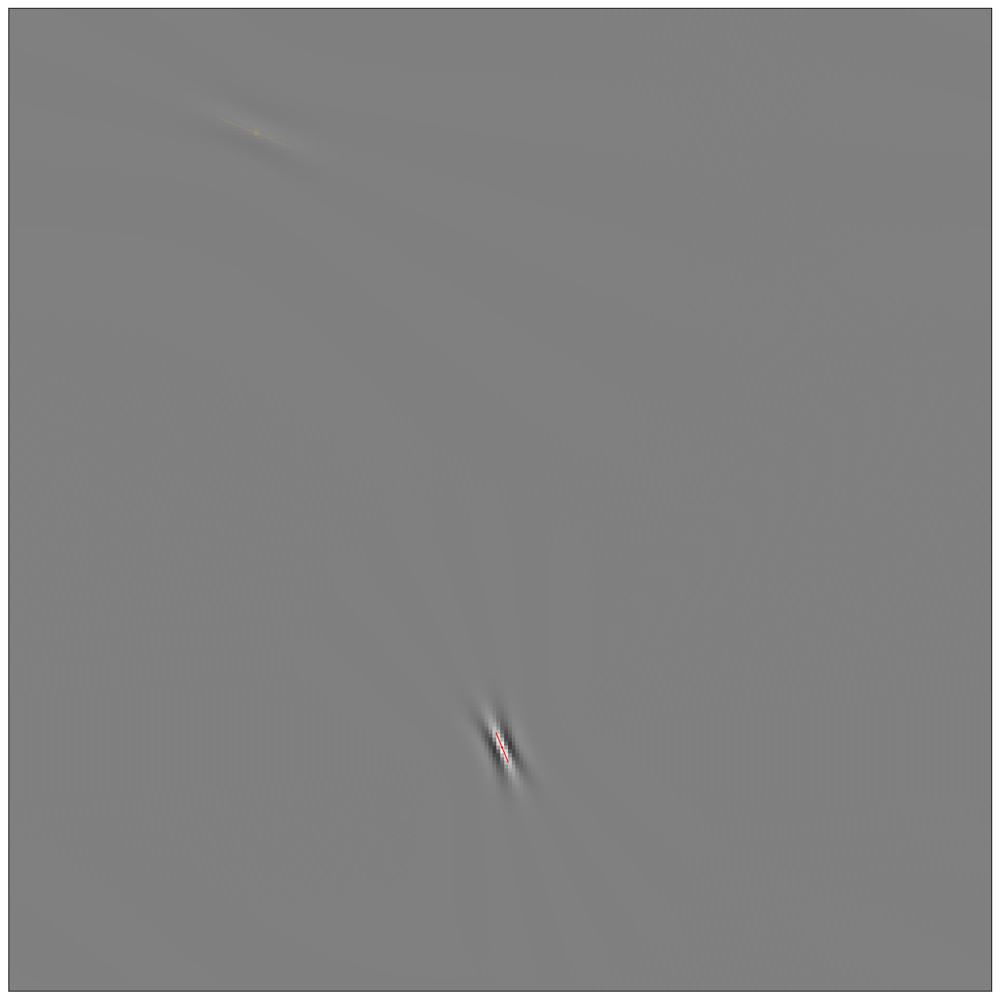

In [20]:
edge_stars = np.vstack((edge_star_in,
                        np.array([edge_star_bis[0], edge_star_bis[1], mp.theta[edge_star_bis[2]], mp.sf_0[edge_star_bis[3]], np.absolute(C[edge_star_bis]), np.angle(C[edge_star_bis])])))
print(edge_stars)
mp.pe.figsize_edges = 9
fig, a = mp.show_edges(edge_stars.T, image=image)

### testing four steps of Matching Pursuit

Let's redo these steps using the ``run_mp`` function:

In [21]:
# filters in Fourier space
FT_lg_in = mp.loggabor(edge_in[0], edge_in[1], sf_0=mp.sf_0[edge_in[3]],
                         B_sf=mp.pe.B_sf, theta= mp.theta[edge_in[2]], B_theta=mp.pe.B_theta)
FT_lg_bis = mp.loggabor(edge_bis[0], edge_bis[1], sf_0=mp.sf_0[edge_bis[3]],
                         B_sf=mp.pe.B_sf, theta= mp.theta[edge_bis[2]], B_theta=mp.pe.B_theta)
# mixing both and shows one
FT_lg_ = C_in *  FT_lg_in + C_bis * FT_lg_bis


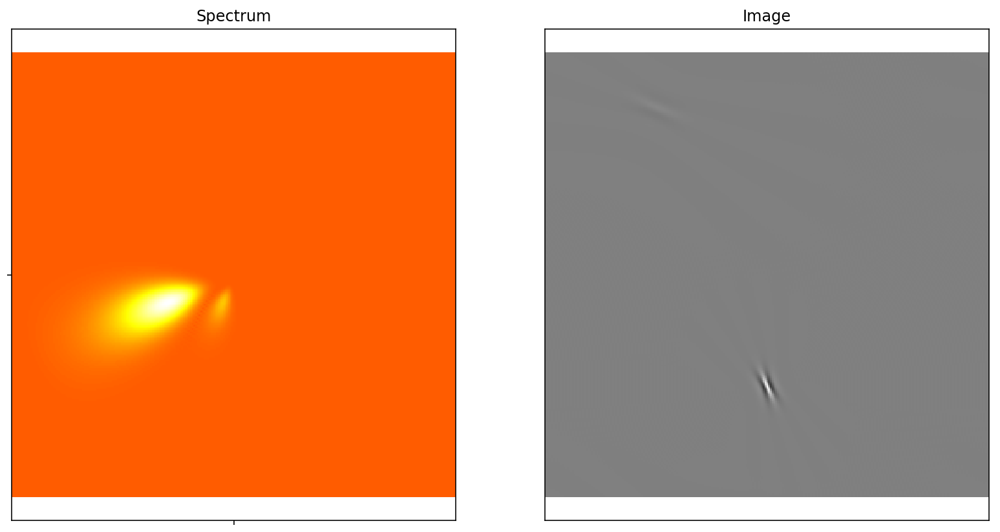

In [22]:
fig = mp.show_FT(FT_lg_)

In [23]:
image = mp.invert(FT_lg_)
edges, C_res = mp.run_mp(image, verbose=True)

Edge  0 / 4  - Max activity  :  0.000  phase=  98.412  deg,  @  (192, 128, 2, 2)
Edge  1 / 4  - Max activity  :  0.000  phase=  -78.690  deg,  @  (32, 64, 8, 4)
Edge  2 / 4  - Max activity  :  0.000  phase=  67.620  deg,  @  (192, 128, 2, 2)
Edge  3 / 4  - Max activity  :  0.000  phase=  -96.698  deg,  @  (190, 127, 2, 2)


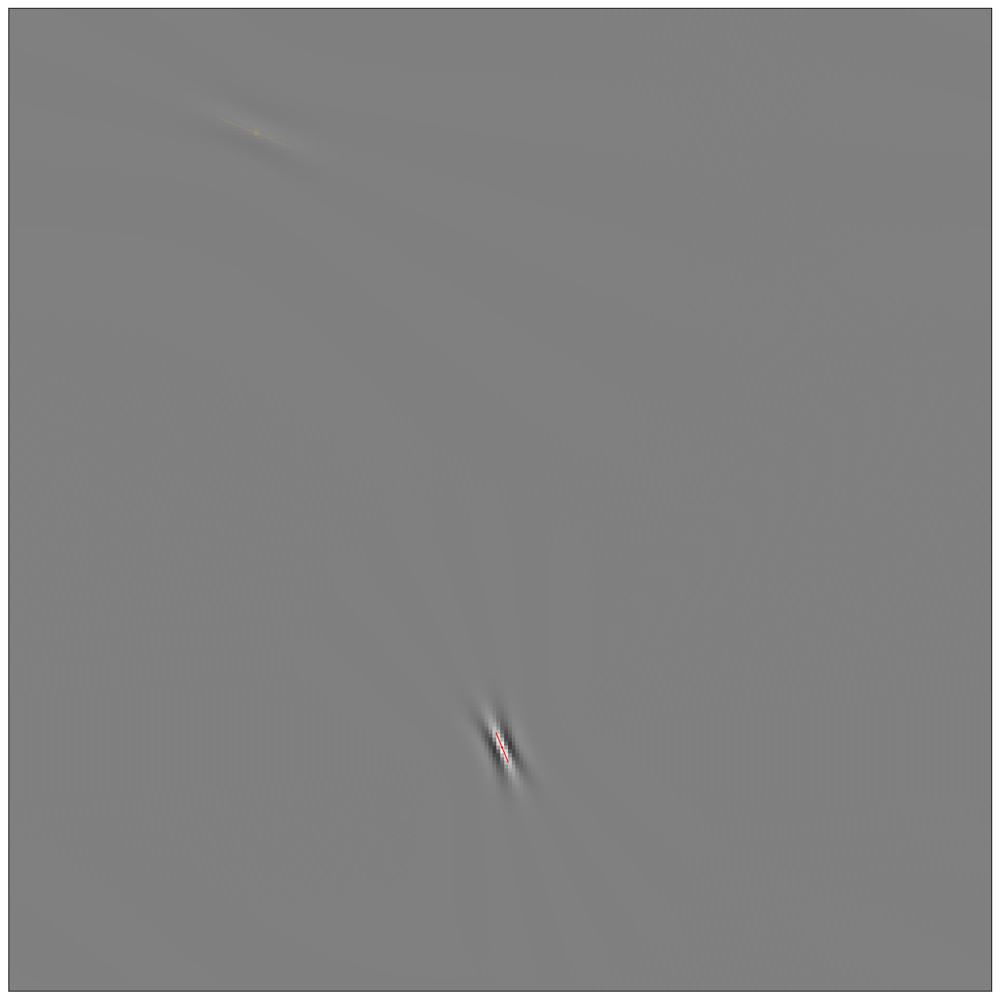

In [24]:
fig, a = mp.show_edges(edges, image=image)

### Testing edge detection on a natural image

trying out on a [flikr image from @Doug88888](https://www.flickr.com/photos/doug88888/6370387703):

In [25]:
!curl https://farm7.staticflickr.com/6058/6370387703_5e718ea681_q_d.jpg -o ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/6370387703_5e718ea681_q_d.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 10602  100 10602    0     0  18814      0 --:--:-- --:--:-- --:--:-- 18831


In [26]:
%ls -l ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial*

-rw-r--r--  1 laurentperrinet  staff   98432 Jun 25 14:17 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial.npy
-rw-r--r--  1 laurentperrinet  staff   16512 Jun 25 14:17 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_MSE.npy
-rw-r--r--  1 laurentperrinet  staff   98432 Jun 18 18:26 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_lena.npy
-rw-r--r--  1 laurentperrinet  staff  145757 Jun 26 12:05 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.gif
-rw-r--r--  1 laurentperrinet  staff   84303 Jun 26 12:05 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4


In [27]:
import numpy as np
from SparseEdges import SparseEdges
mp = SparseEdges('https://raw.githubusercontent.com/bicv/SparseEdges/master/default_param.py')
if not mp.pe.do_whitening: print('\!/ Wrong parameters... \!/')
    
# where should we store the data + figures generated by this notebook
import os
name = 'MPtutorial'
mp.pe.matpath, mp.pe.figpath = '../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit', '../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit'
mp.pe.do_mask = True

mp.pe.N = 2048
mp.pe.MP_alpha = 1.
mp.pe.MP_alpha = .8

mp.pe.mask_exponent = 6.

mp.init()

# defining input image (get it @ https://www.flickr.com/photos/doug88888/6370387703)
#image = mp.imread('https://farm7.staticflickr.com/6058/6370387703_5e718ea681_q_d.jpg')
image = mp.imread(os.path.join(mp.pe.matpath, '6370387703_5e718ea681_q_d.jpg'))

white = mp.pipeline(image, do_whitening=True)

import os
matname = os.path.join(mp.pe.matpath, name + '.npy')

try:
    edges = np.load(matname)
except:
    edges, C_res = mp.run_mp(white, verbose=True)
    np.save(matname, edges)    

matname_MSE = os.path.join(mp.pe.matpath, name + '_MSE.npy')
try:
    MSE = np.load(matname_MSE)
except:
    MSE = np.ones(mp.pe.N)
    image_rec = np.zeros_like(image)
    for i_N in range(mp.pe.N):
        MSE[i_N] =  ((white-image_rec)**2).sum()
        image_rec += mp.reconstruct(edges[:, i_N][:, np.newaxis])
        
    np.save(matname_MSE, MSE)        


Showing the original image with the edges overlaid:

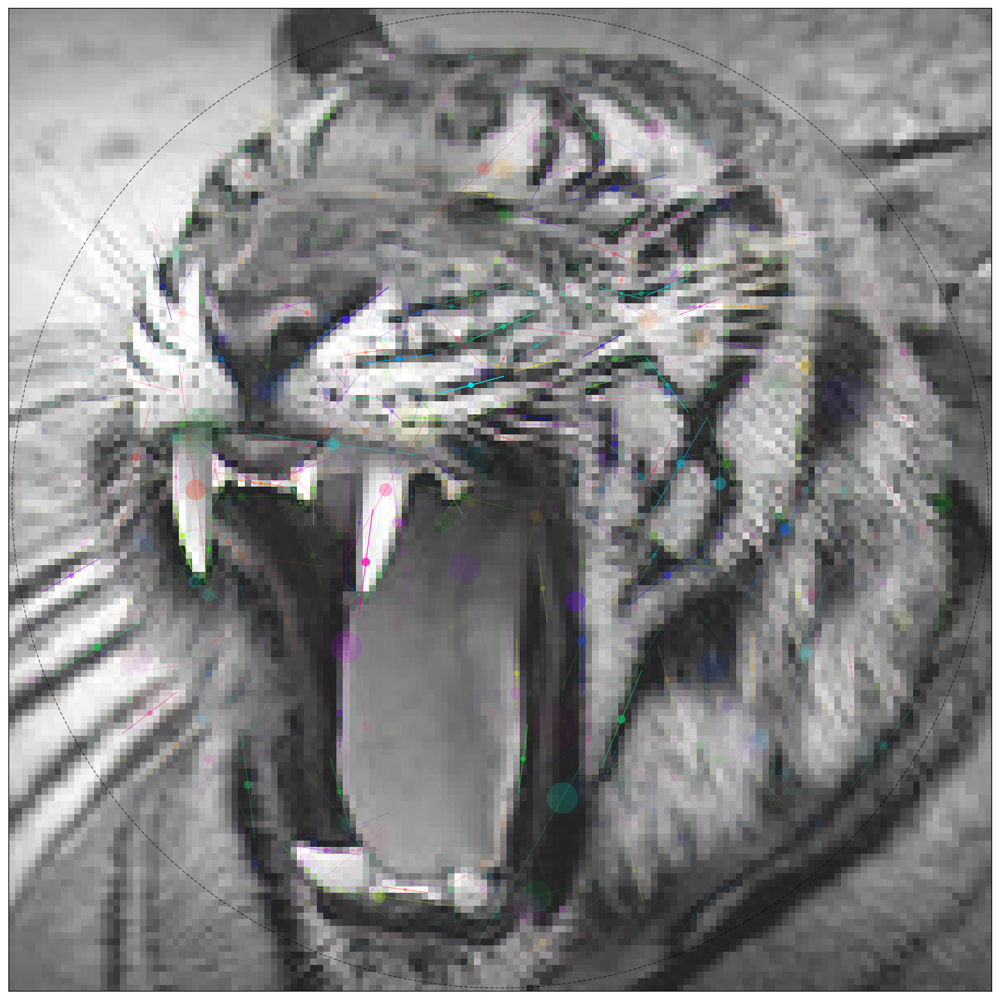

In [28]:
#edges = np.load(matname)

fig_width_pt = 318.670  # Get this from LaTeX using \showthe\columnwidth
inches_per_pt = 1.0/72.27               # Convert pt to inches
fig_width = fig_width_pt*inches_per_pt  # width in inches
mp.pe.figsize_edges = .382 * fig_width  # useful for papers
mp.pe.figsize_edges = 9 # useful in notebooks
mp.pe.line_width = 1.
mp.pe.scale = 1.
fig, a = mp.show_edges(edges, image=image, show_phase=True, show_mask=True)
#mp.savefig(fig, name + '_rec')

A nice property of Matching Pursuit is that one can reconstruct the image from the edges:

In [29]:
image_rec = mp.reconstruct(edges)
print('remaining energy  = ', ((white-image_rec)**2).sum()/(white**2).sum()*100, '%')

remaining energy  =  1.7582915882828347 %


The whitened reconstructed image looks like:

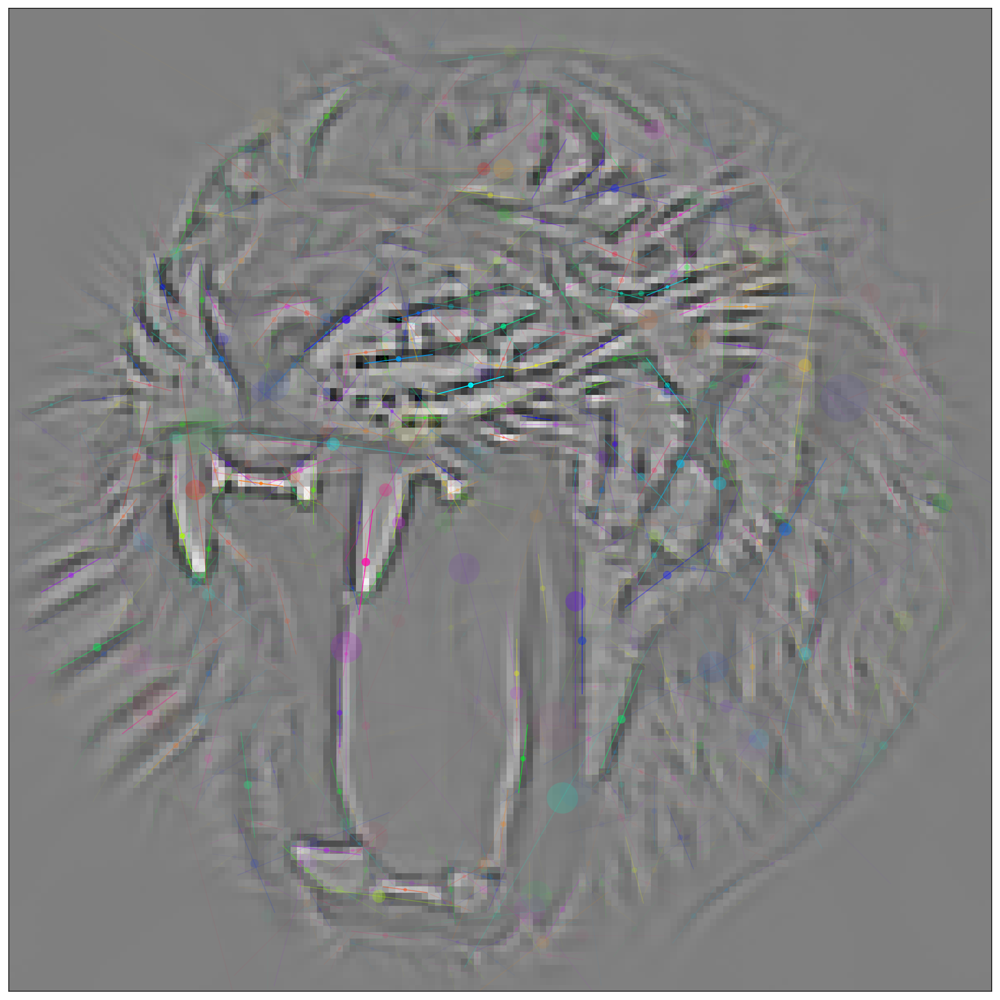

In [30]:
fig, a = mp.show_edges(edges, image=image_rec);

Knowing that we may reconstructing back a non-whitened image by applying the inverse filter:

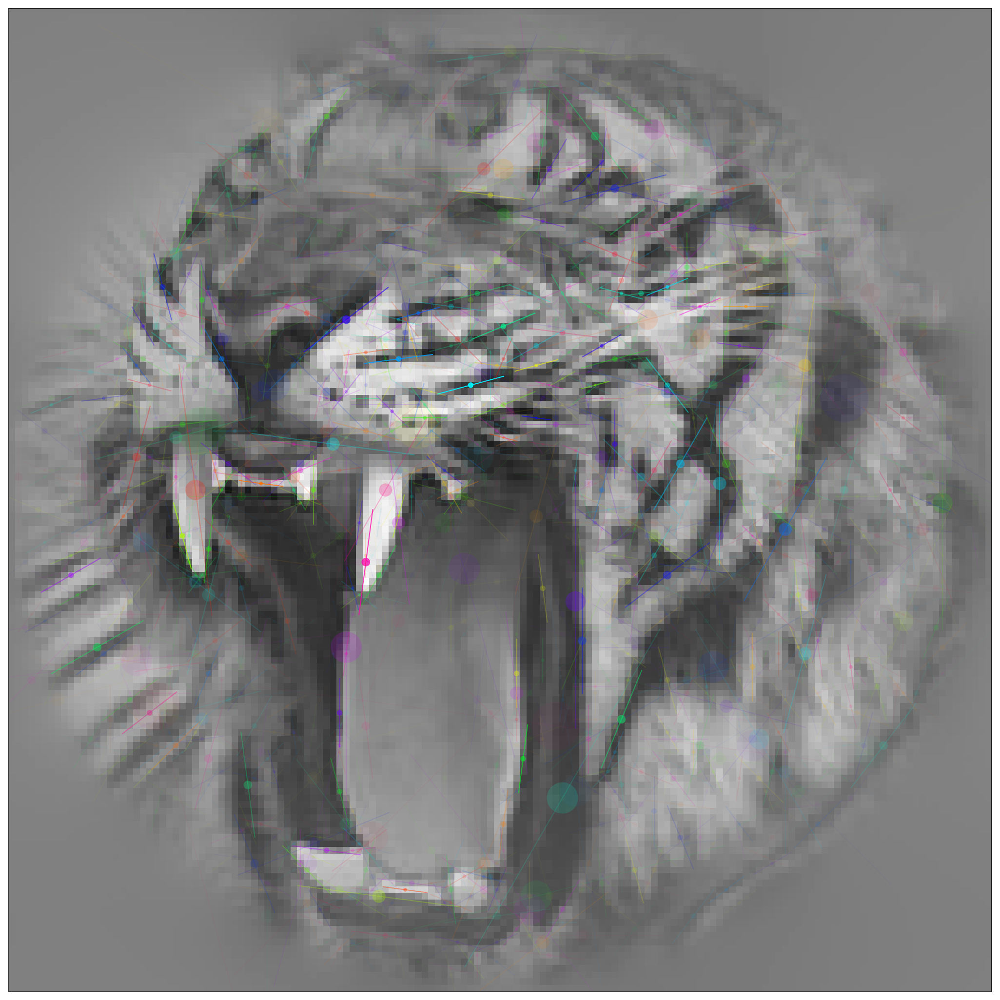

In [31]:
fig, a = mp.show_edges(edges, image=mp.dewhitening(white));

Then we may reconstruct the image estimated from the edges:

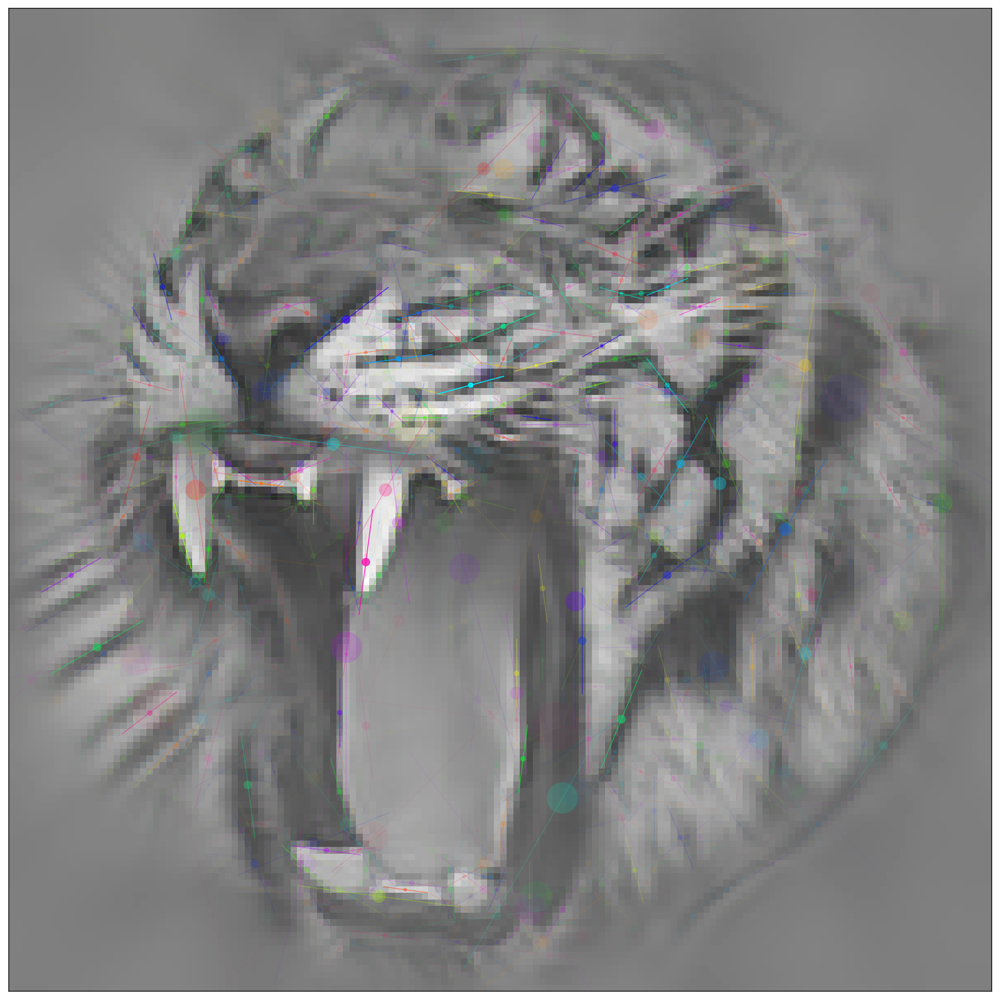

In [32]:
fig, a = mp.show_edges(edges, image=mp.dewhitening(image_rec));

Another nice property of Matching Pursuit is that one may guess the reconstructed error just from the coefficients, without having to actually reconstruct the image:

stats on white: -3.362092974025879e-06 0.13311745527744864 19.967618297985922 19.967618297985922
mp.pe.MP_alpha= 0.8


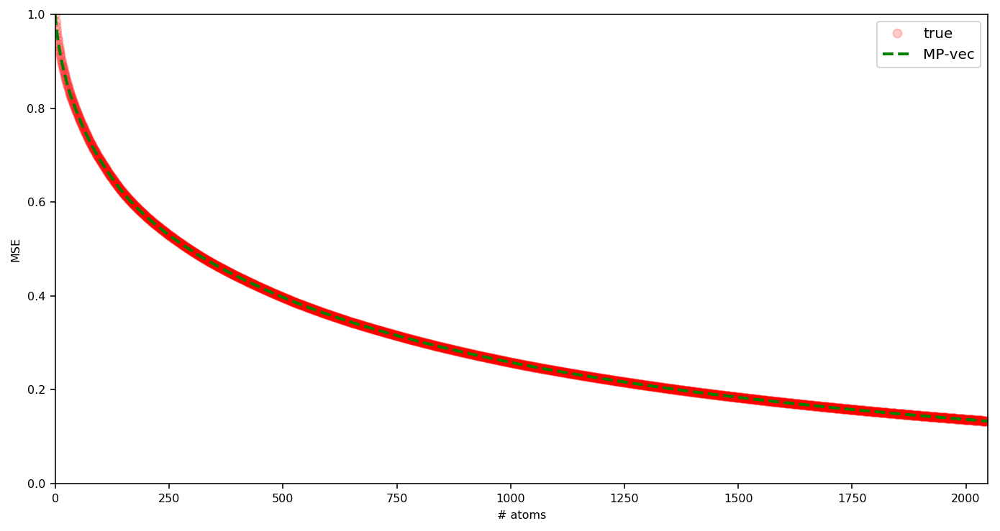

In [33]:
# checking the quick computation of the MSE in MP
MSE_0 = (white**2).sum()
print('stats on white:', white.mean(), white.std(), np.sqrt(MSE_0), np.sqrt(MSE[0]))
print ('mp.pe.MP_alpha=', mp.pe.MP_alpha)    
MP_alpha = 1.2 #mp.pe.MP_alpha
MSE_MP = np.ones(mp.pe.N)
MSE_MP[1:] = 1. - np.cumsum(edges[4, :-1]**2) / MSE_0  * (2 -  mp.pe.MP_alpha)/mp.pe.MP_alpha

plt.figure(figsize=(12,6))
plt.subplot(111)
plt.plot(np.sqrt(MSE/MSE[0]), 'ro', label='true', alpha=.2)
plt.plot(np.sqrt(MSE_MP), 'g--', label='MP-vec', lw=2)
plt.xlim([0, mp.pe.N])
plt.ylim([0, 1])
plt.xlabel('# atoms')
plt.ylabel('MSE')
_ = plt.legend()

Note that the representation is extremly sparse:

In [34]:
print('Total number of coefficients:', int(mp.oc))
print('Number of active coefficients:', mp.pe.N)
print('Ratio of active coefficients:', (mp.pe.N/mp.oc)*100., '%')

Total number of coefficients: 5400000
Number of active coefficients: 2048
Ratio of active coefficients: 0.037925925925925925 %


These coefficients can be plotted on the multiresolution representation:

/Users/laurentperrinet/pool/science/LogGabor/LogGabor/LogGabor.py:95: RuntimeWarning: invalid value encountered in true_divide
  im_RGB /= im_RGB.max()
/usr/local/lib/python3.6/site-packages/numpy/core/_methods.py:29: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims)


<Figure size 1008x622.978 with 0 Axes>

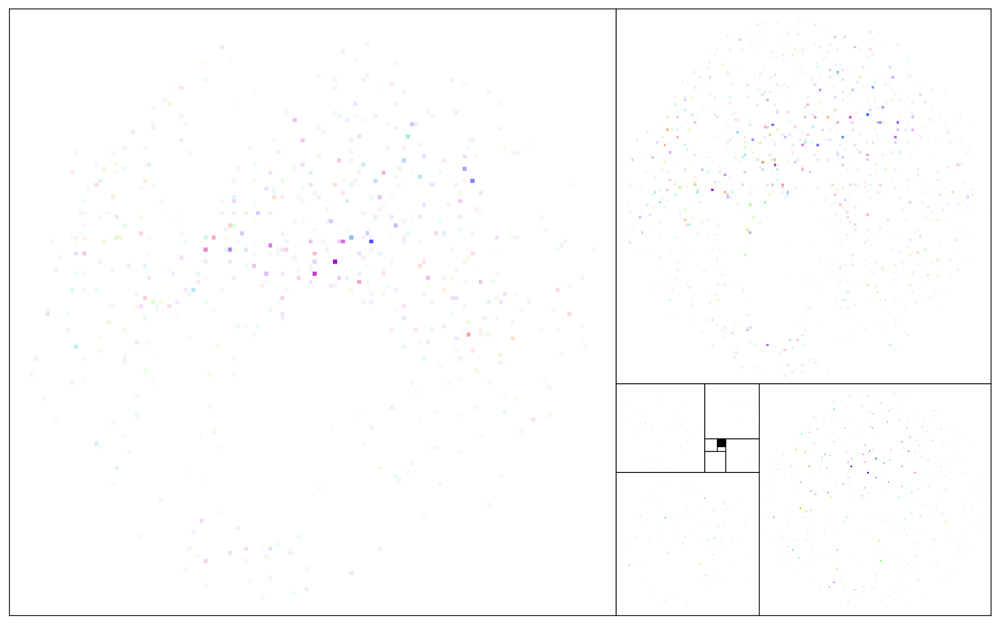

In [35]:
opts= {'vmin':0., 'vmax':1., 'interpolation':'nearest', 'origin':'upper'}

fig_width = 14
phi = (np.sqrt(5) +1.)/2. # golden number
fig = plt.figure(figsize=(fig_width, fig_width/phi))
xmin, ymin, size = 0, 0, 1.

C_sparse = np.zeros((mp.pe.N_X, mp.pe.N_Y, mp.pe.n_theta, mp.n_levels))

for edge in edges.T:
    x, y, theta, sf, coeff, phase = edge
    i_theta = np.argmax(mp.theta == theta)
    level = np.argmax(mp.sf_0 == sf)
    C_sparse[int(x), int(y), i_theta, level] += coeff
    
fig, axs = mp.golden_pyramid(C_sparse);

#mp.savefig(fig, name + '_pyr');

Voilà, hope you liked this introduction! Please leave comments below if you have any question regarding this post.

### Showing progressive reconstruction

Below, we show that a nice property of Matching Pursuit is that it allows to progressively reconstruct the image. 

In [36]:
image_true = mp.dewhitening(white)

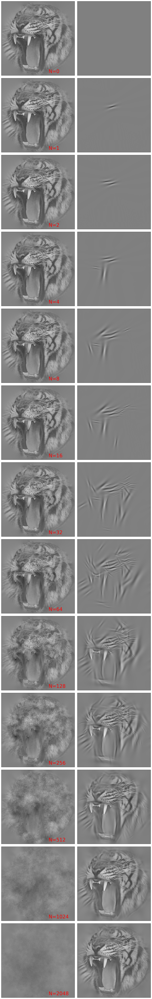

In [37]:
list_of_number_of_edge = [ 0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048] # np.logspace(1, 10, 10, base=2) #

fig_width = 14
vmax = 1.
fig, axs = plt.subplots(len(list_of_number_of_edge), 2, figsize=(fig_width, fig_width/2*len(list_of_number_of_edge)))
vmax = image.max()
for i_ax, number_of_edge in enumerate(list_of_number_of_edge):
    edges_ = edges[:, :number_of_edge][..., np.newaxis]
    image_rec = mp.dewhitening(mp.reconstruct(edges_))
    fig, axs[i_ax, 0] = mp.imshow((image_true-image_rec)/vmax, fig=fig, ax=axs[i_ax, 0], norm=False)
    axs[i_ax, 0].text(96, 144, 'N=%d' % number_of_edge, color='red', fontsize=32)
    fig, axs[i_ax, 1] = mp.imshow((image_rec), fig=fig, ax=axs[i_ax, 1], norm=False)
    plt.tight_layout()

#mp.savefig(fig, name + '_rec')

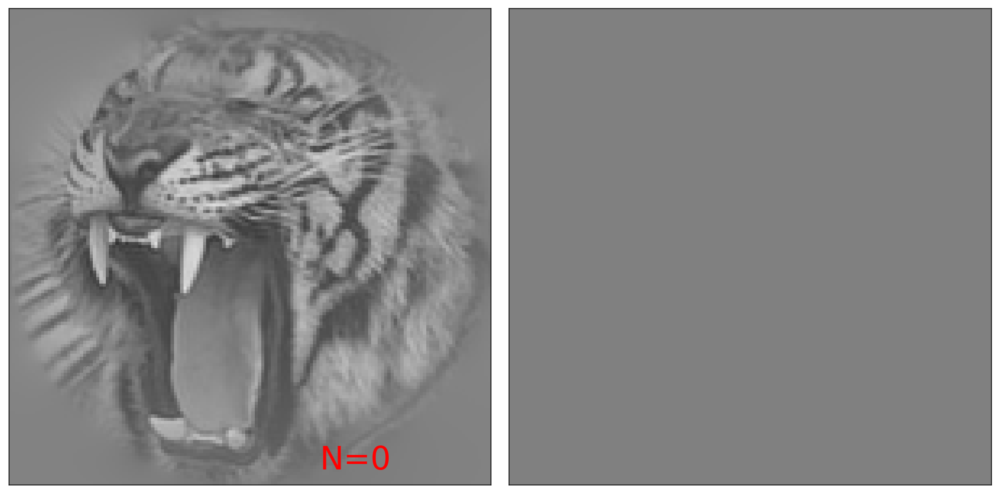

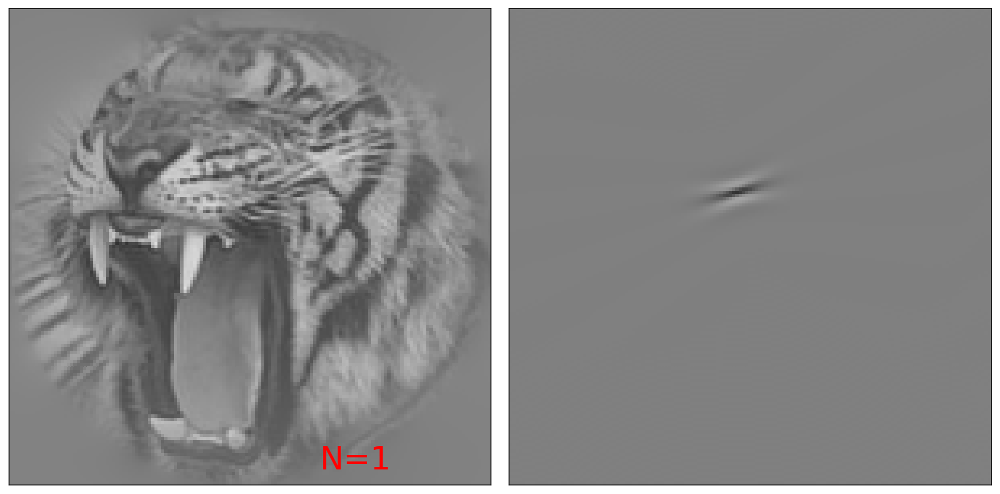

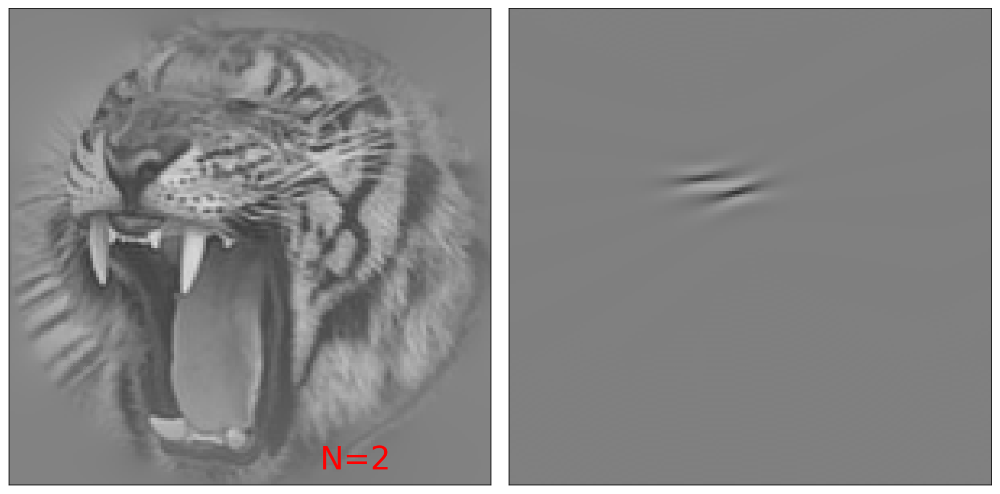

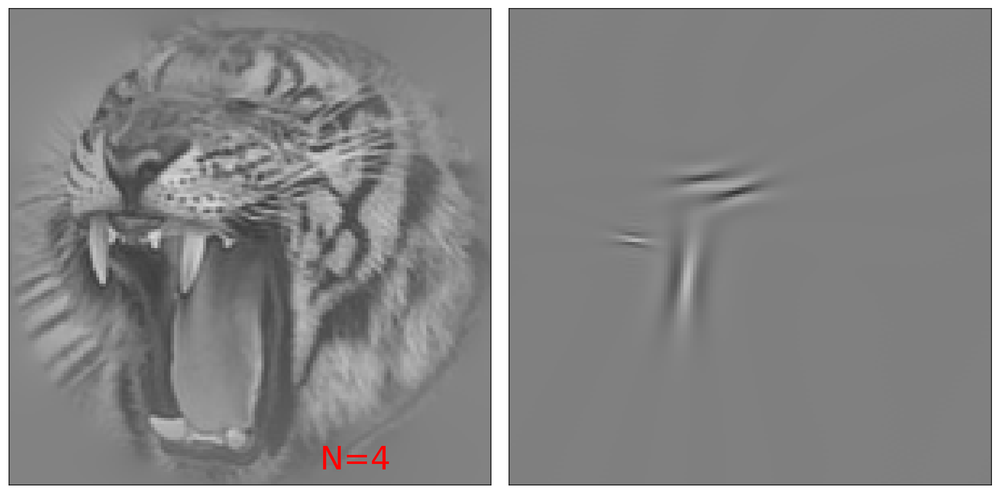

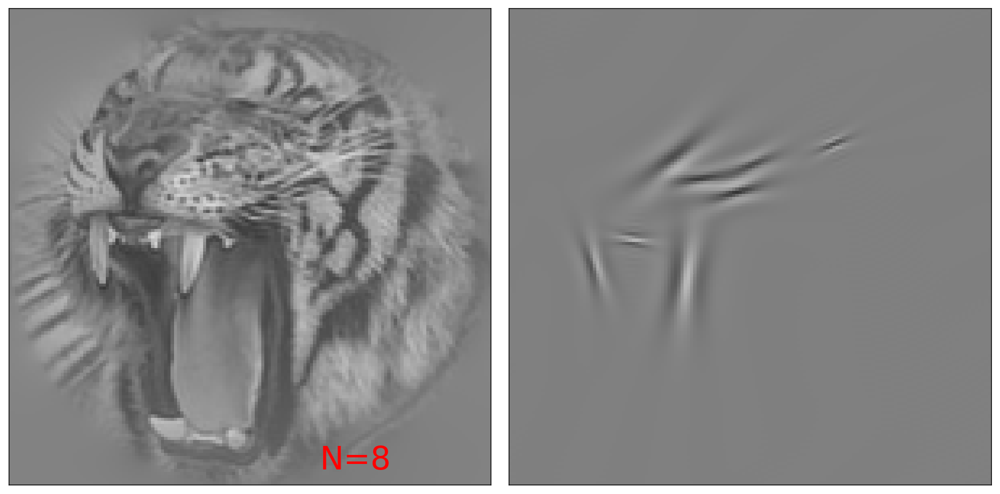

...

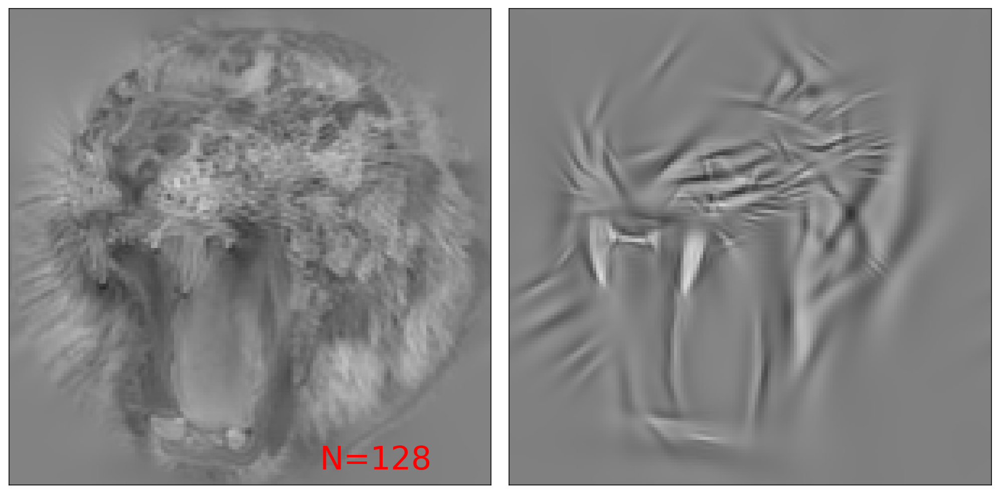

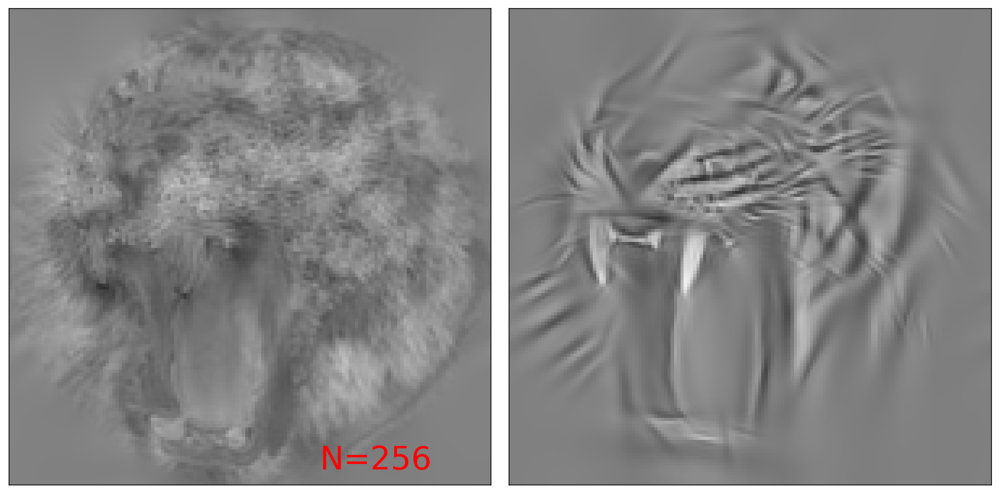

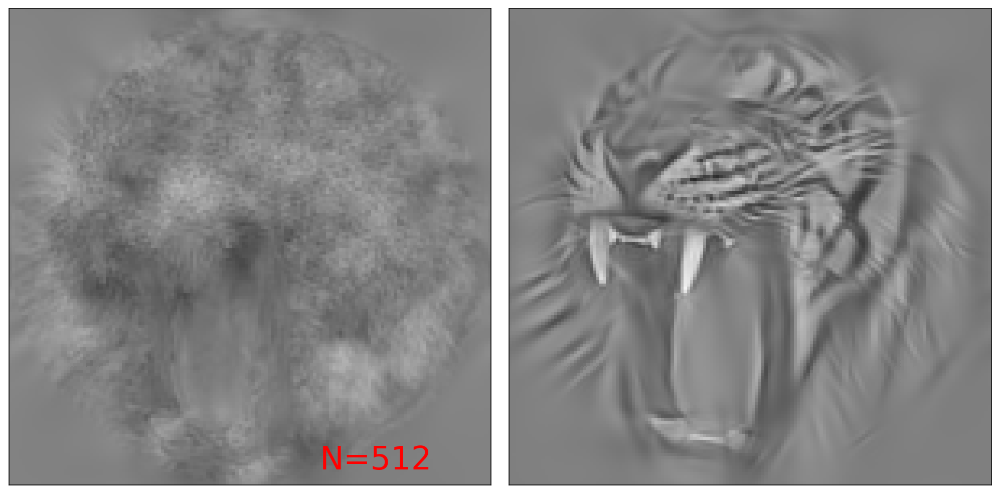

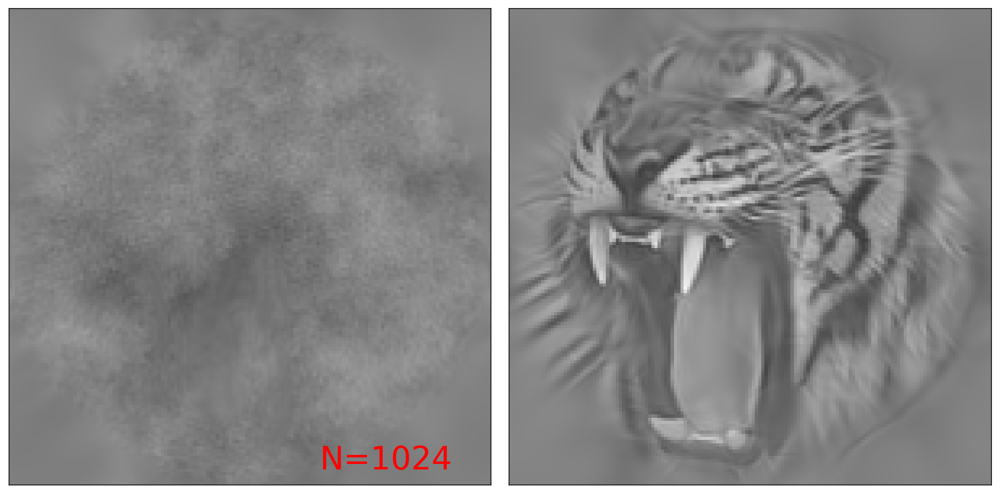

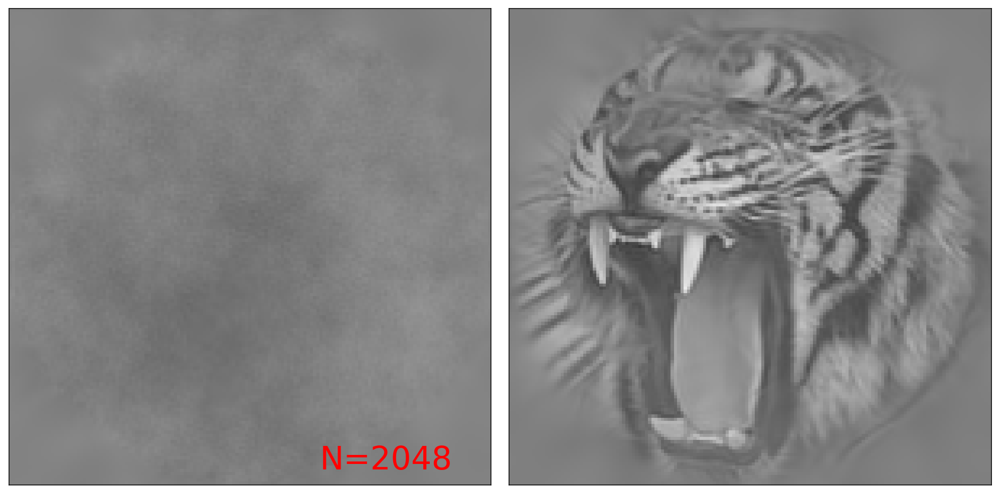

In [38]:
list_of_number_of_edge = [ 0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048] # np.logspace(1, 10, 10, base=2) #

fig_width = 14
vmax = 1.
vmax = image.max()
for number_of_edge in list_of_number_of_edge:
    fig, axs = plt.subplots(1, 2, figsize=(fig_width, fig_width/2))
    edges_ = edges[:, :number_of_edge][..., np.newaxis]
    image_rec = mp.dewhitening(mp.reconstruct(edges_))
    fig, axs[0] = mp.imshow((image_true-image_rec)/vmax, fig=fig, ax=axs[0], norm=False)
    axs[0].text(96, 144, 'N=%d' % number_of_edge, color='red', fontsize=32)
    fig, axs[1] = mp.imshow((image_rec), fig=fig, ax=axs[1], norm=False)
    plt.tight_layout()
    #mp.savefig(fig, 'MP_' + str(number_of_edge), formats=['png'])

 93%|█████████▎| 13/14 [00:26<00:02,  2.02s/it]


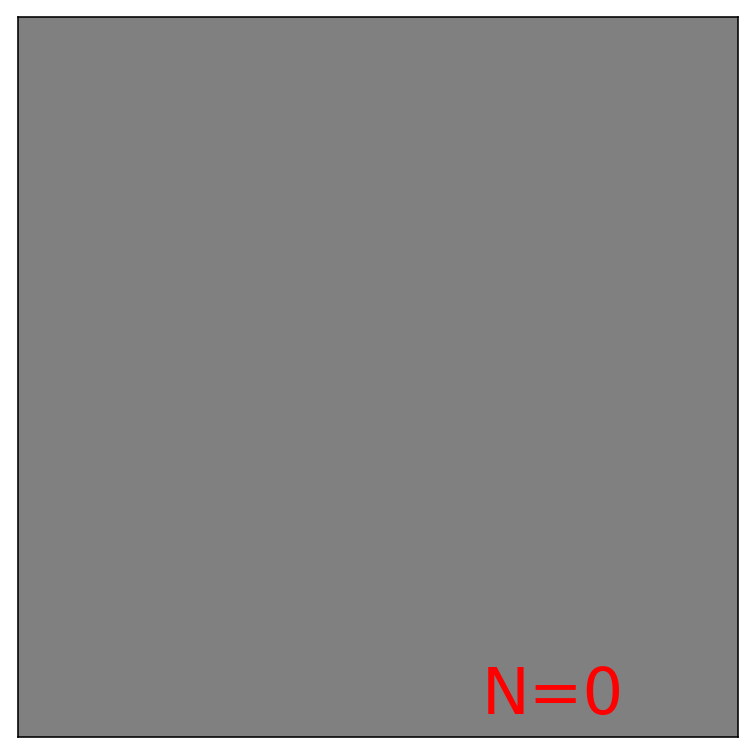

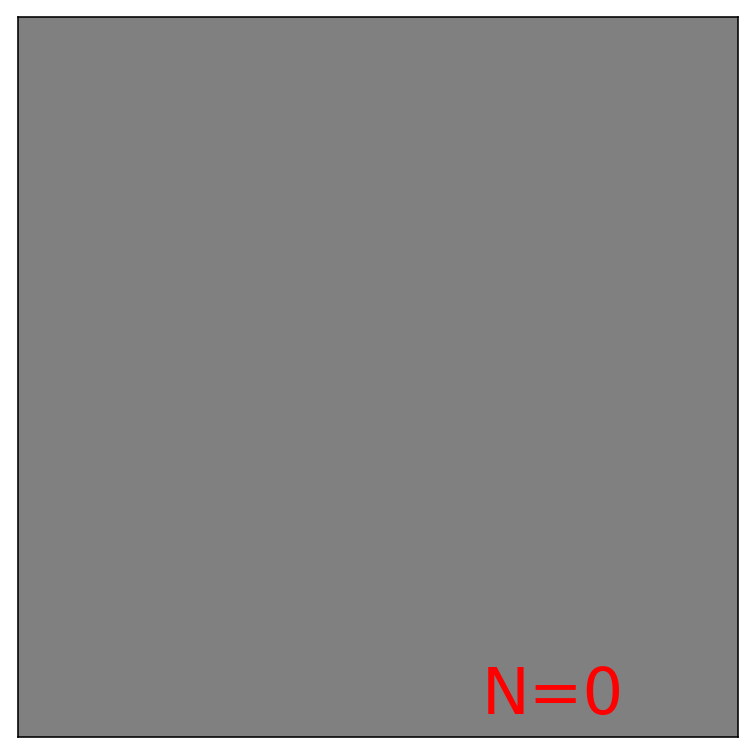

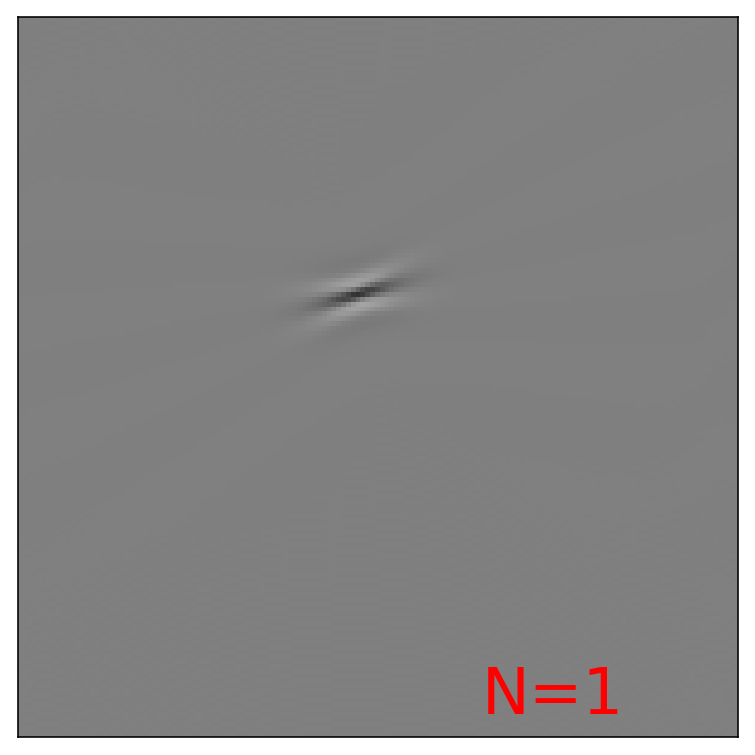

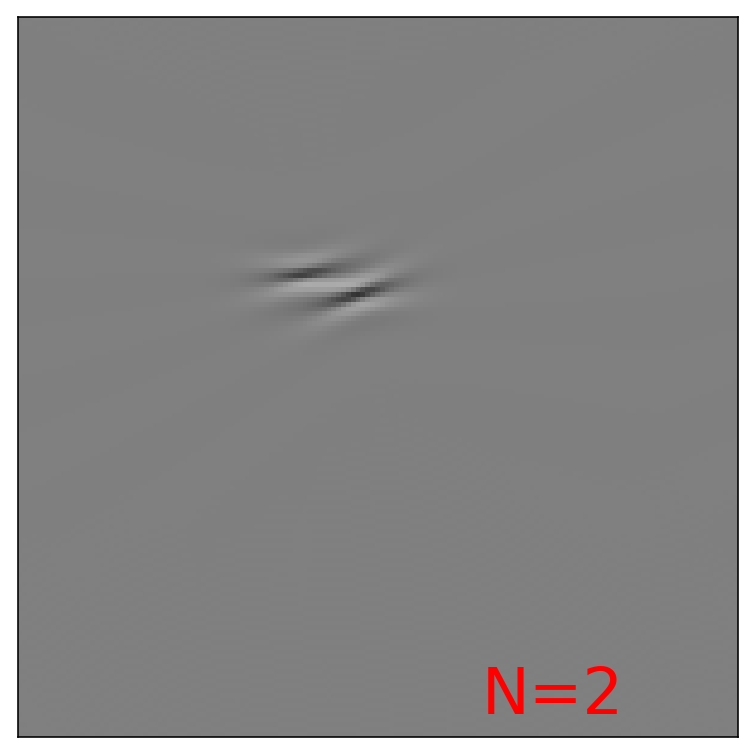

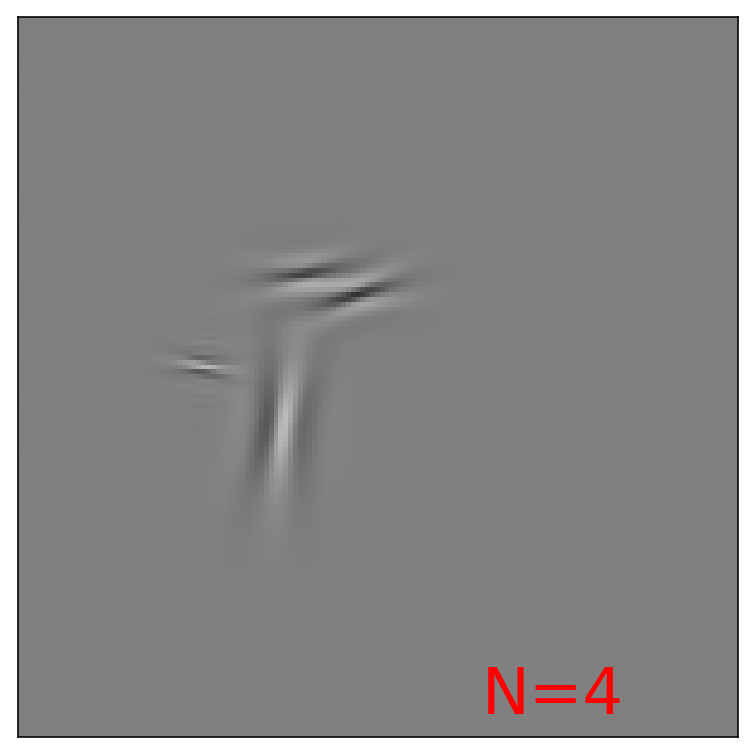

...

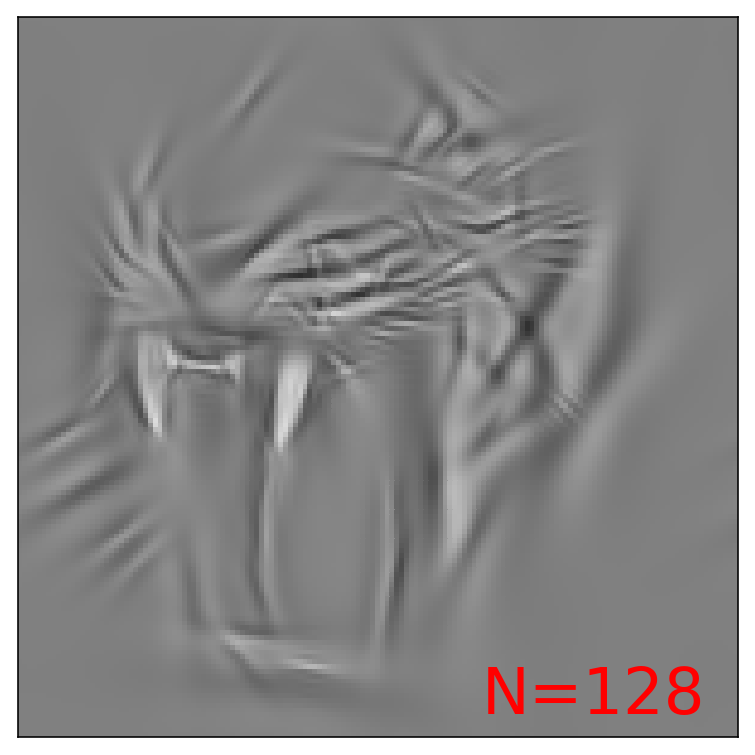

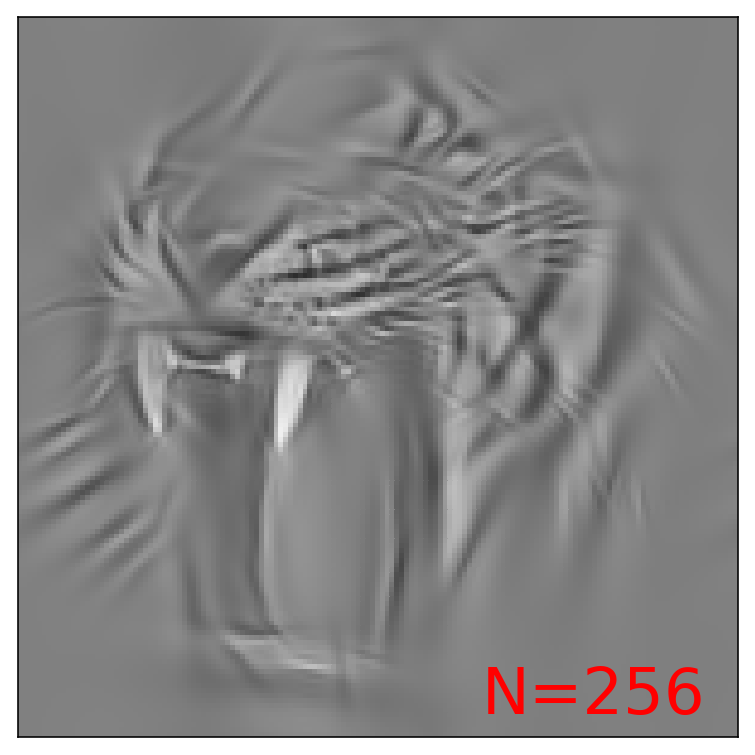

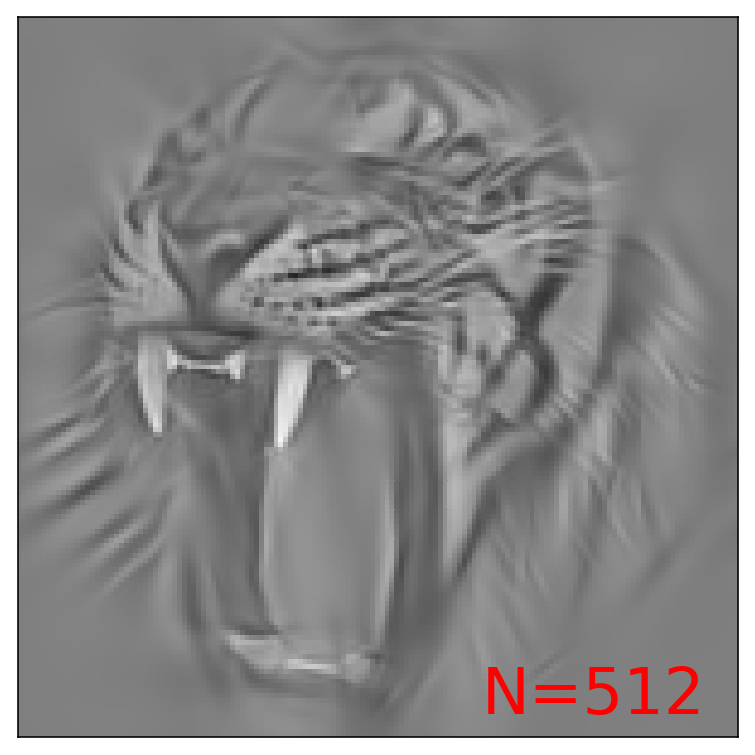

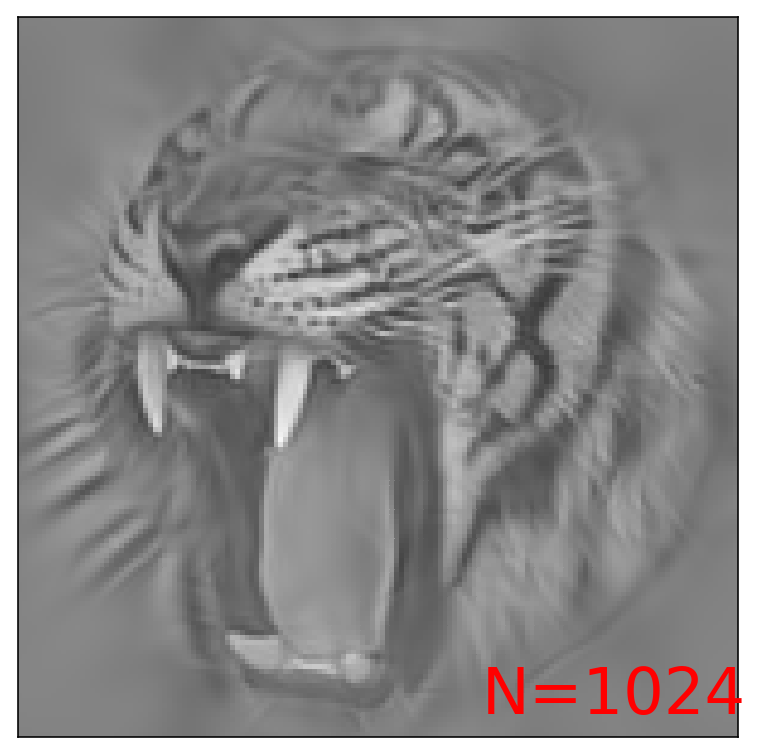

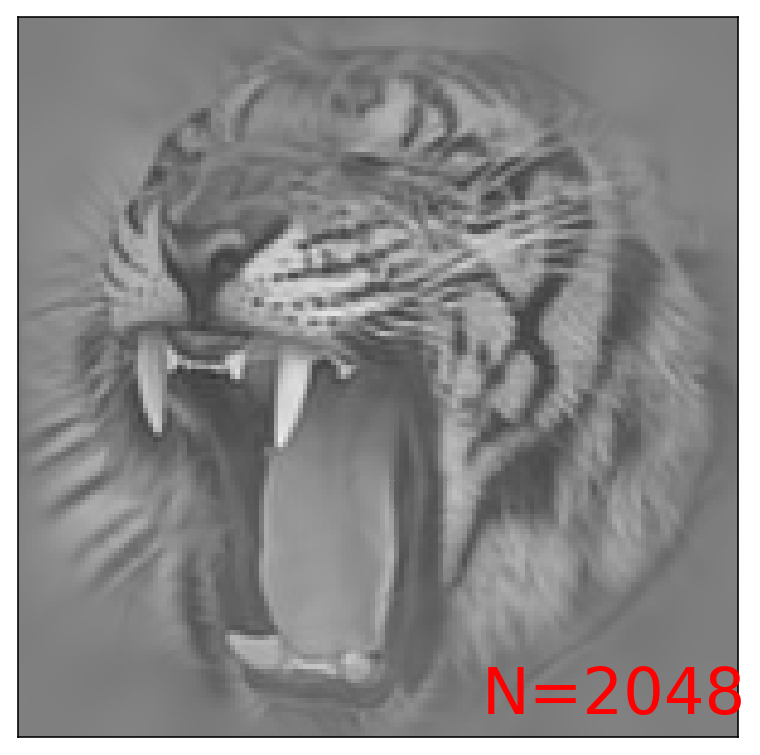

In [39]:
import moviepy.editor as mpy
from moviepy.video.io.bindings import mplfig_to_npimage

def make_frame_mpl(i_frame):
    fig_mpl, ax = plt.subplots(1, figsize=(5, 5), facecolor='white')
    ax = fig_mpl.add_axes([0., 0., 1., 1.], facecolor='w')
    ax.cla()
    plt.setp(ax, xticks=[])
    plt.setp(ax, yticks=[])
    #ax.axis(c='b', lw=0, frame_on=False)
    ax.grid(b=False, which="both")
    number_of_edge = list_of_number_of_edge[int(i_frame)]
    edges_ = edges[:, :number_of_edge][..., np.newaxis]
    image_rec = mp.dewhitening(mp.reconstruct(edges_))
    fig_mpl, ax = mp.imshow((image_rec)/vmax, fig=fig_mpl, ax=ax, norm=False)
    ax.text(96, 144, 'N=%d' % number_of_edge, color='red', fontsize=32)
    return mplfig_to_npimage(fig_mpl) # RGB image of the figure

animation = mpy.VideoClip(make_frame_mpl, duration=len(list_of_number_of_edge))
animation.ipython_display(fps=1, loop=1, autoplay=1)

[MoviePy] >>>> Building video ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4
[MoviePy] Writing video ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4


 93%|█████████▎| 13/14 [00:26<00:02,  2.00s/it]

[MoviePy] Done.
[MoviePy] >>>> Video ready: ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4 



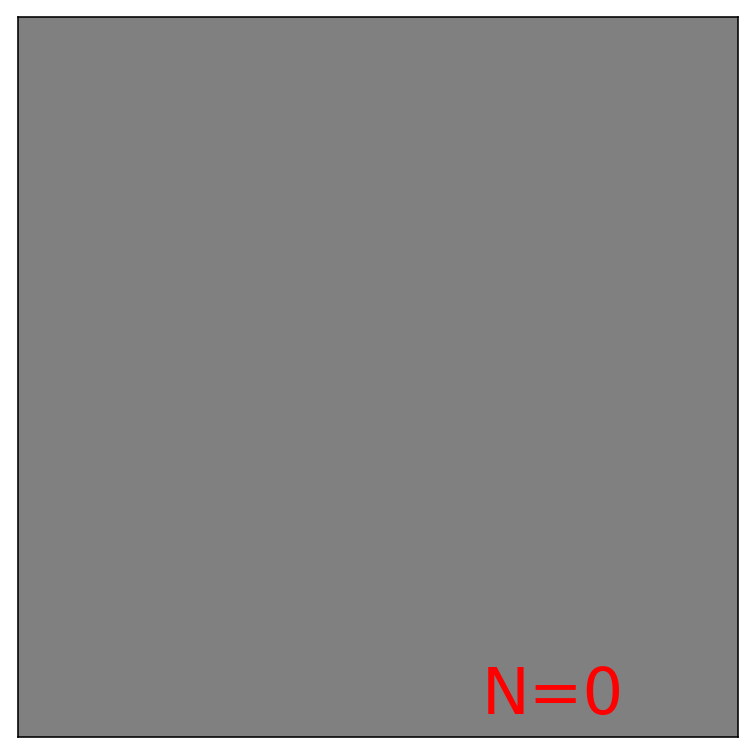

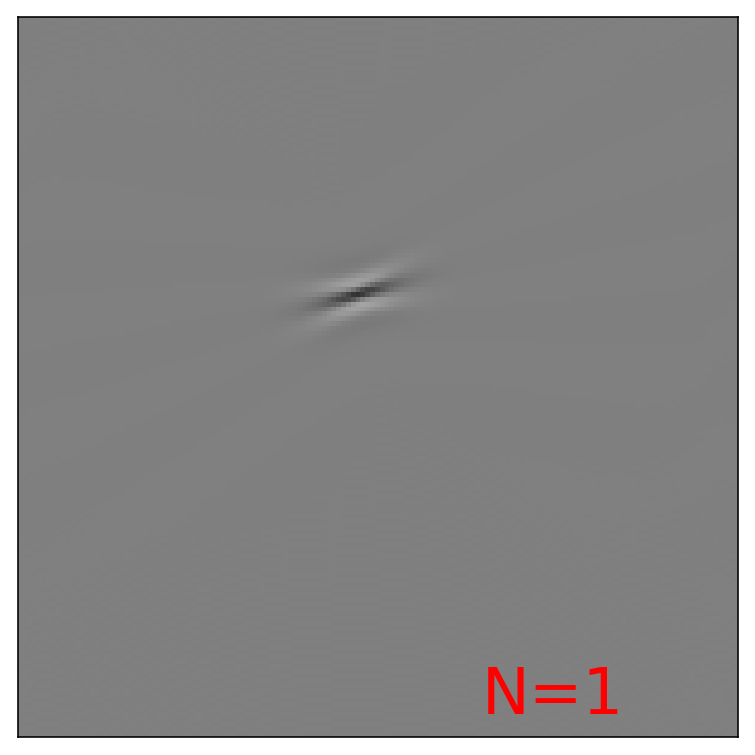

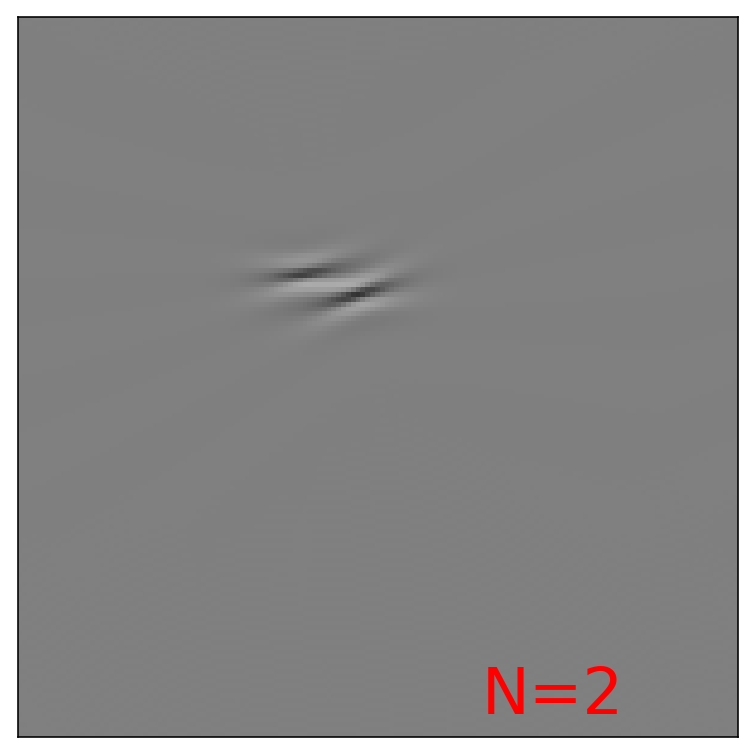

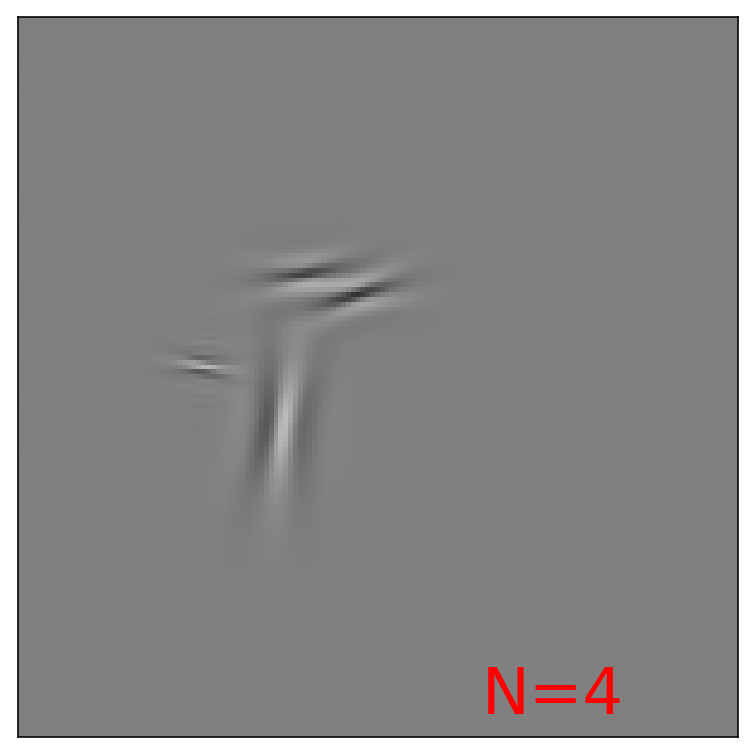

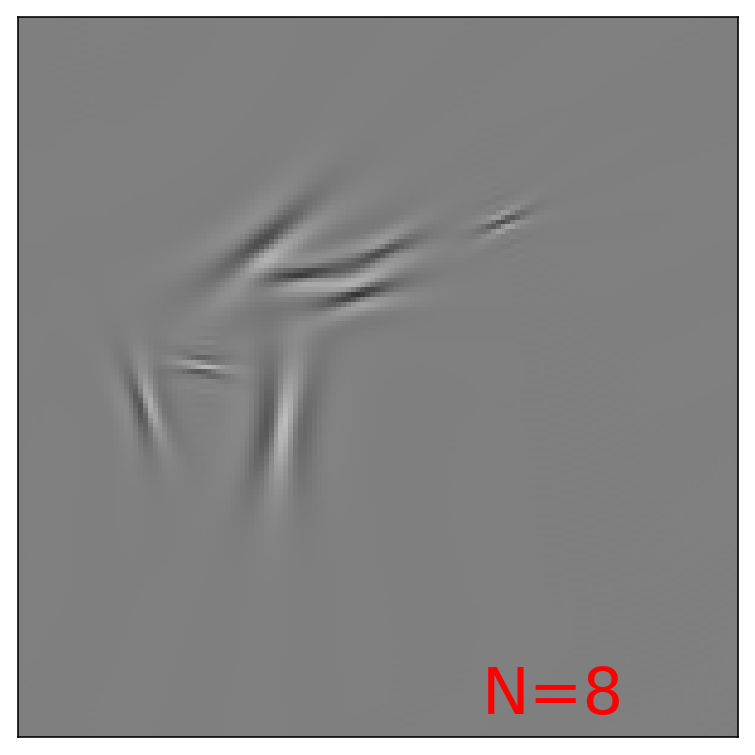

...

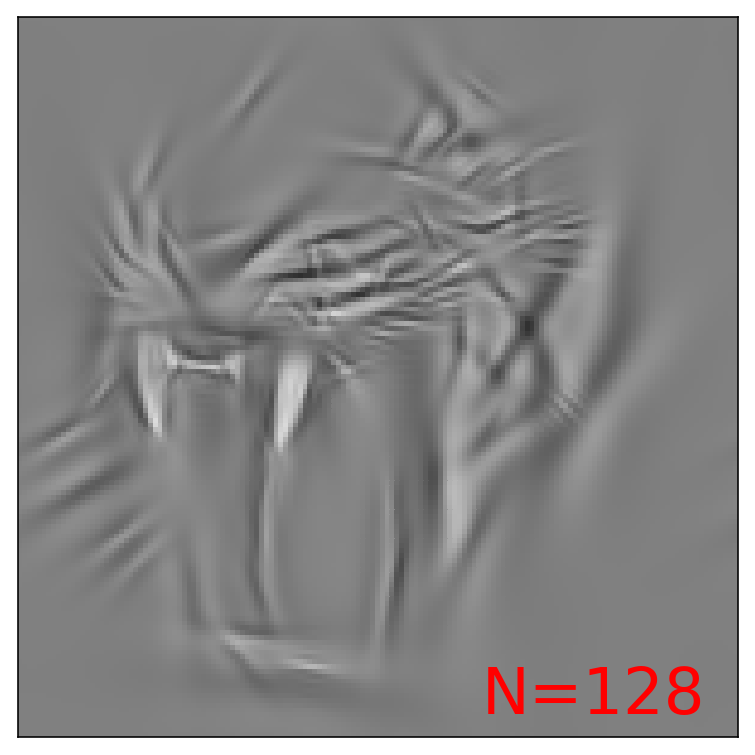

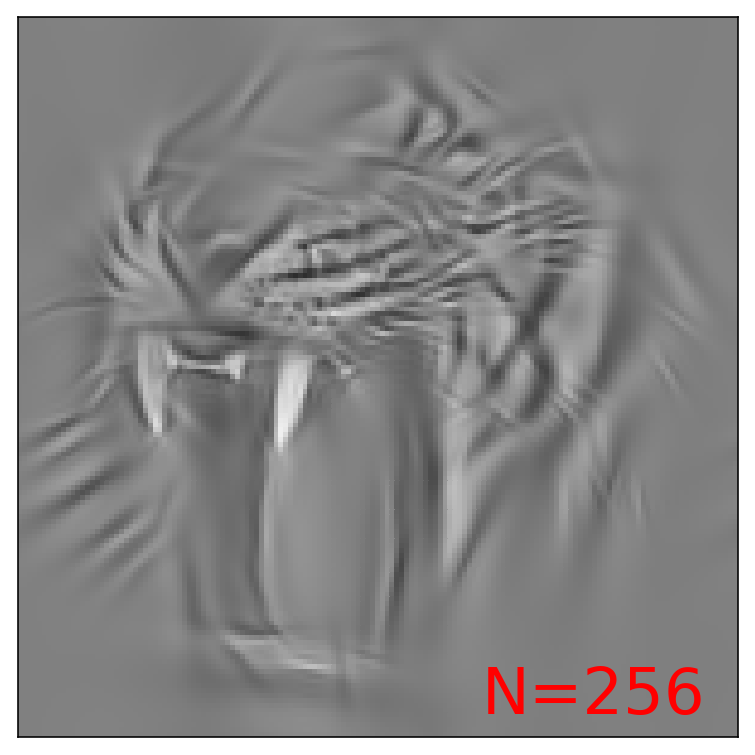

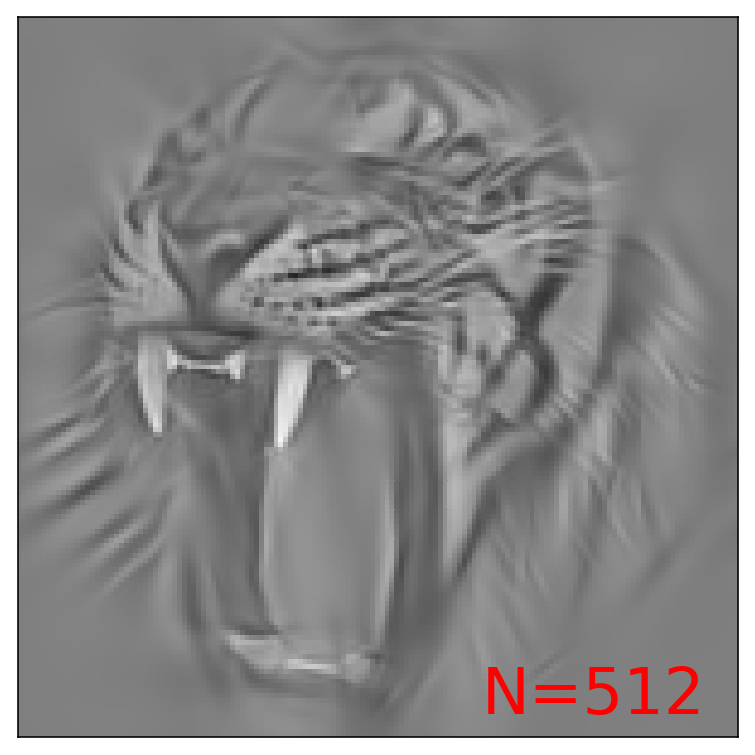

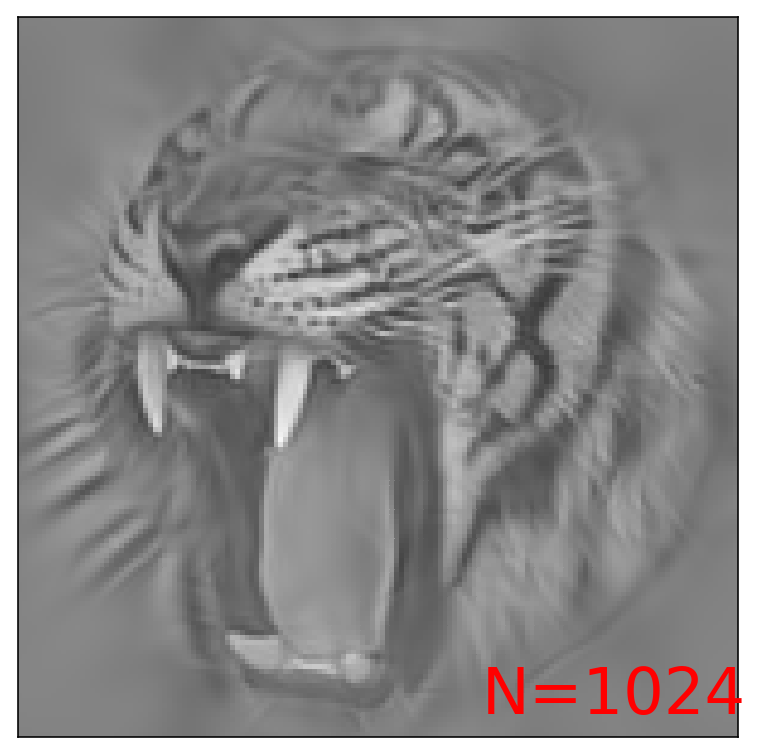

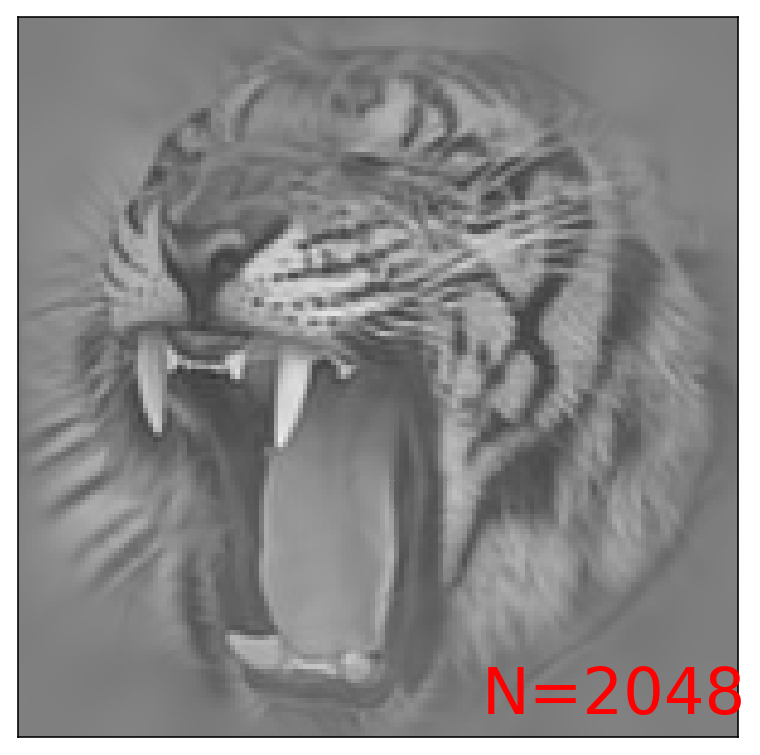

In [40]:
_ = animation.write_videofile(os.path.join(mp.pe.figpath, name + '_rec.mp4'), fps=1)

In [41]:
!ffmpeg -y -i ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4 ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.gif

ffmpeg version 4.0.1 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.1 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libvorbis --enable-libvpx --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/MPtutorial_rec.mp4':
  Metadata:
    major_brand     : 

In [42]:
!curl https://raw.githubusercontent.com/bicv/SparseEdges/master/database/lena256.png  -o ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/lena256.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 68859  100 68859    0     0   156k      0 --:--:-- --:--:-- --:--:--  156k


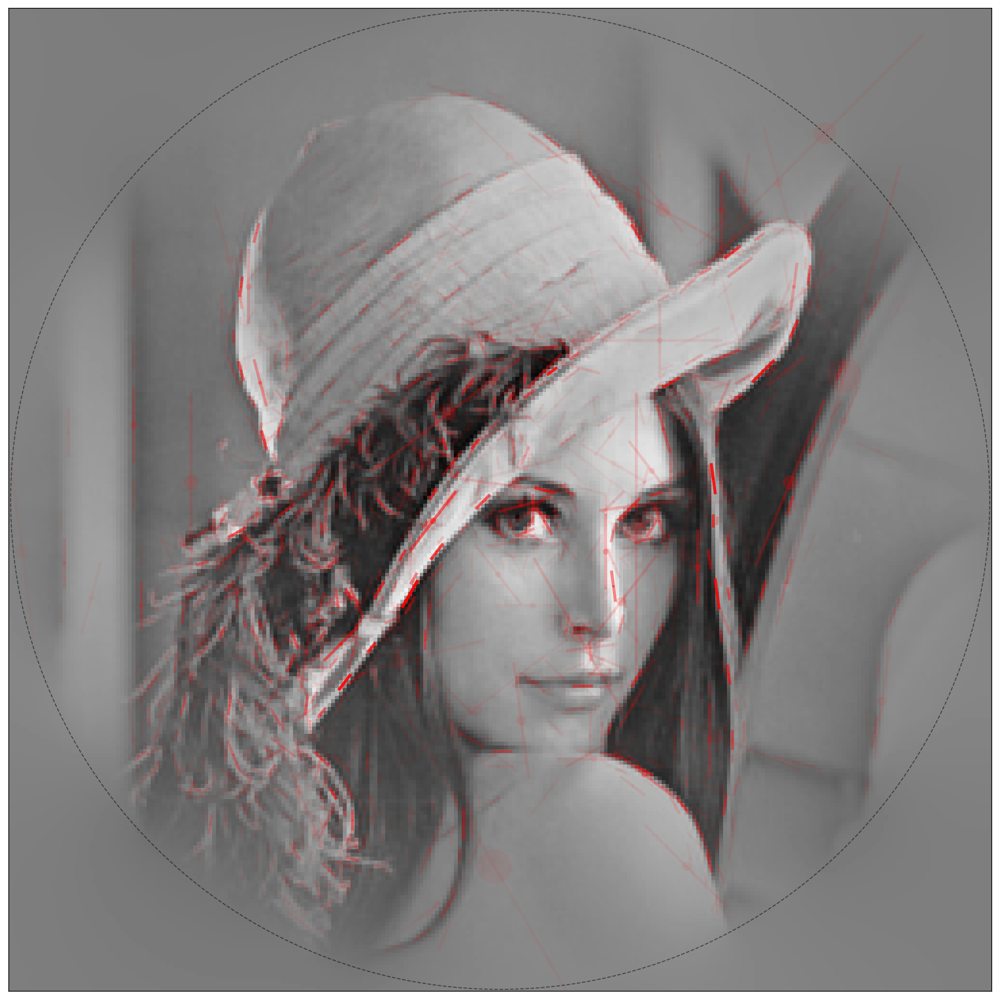

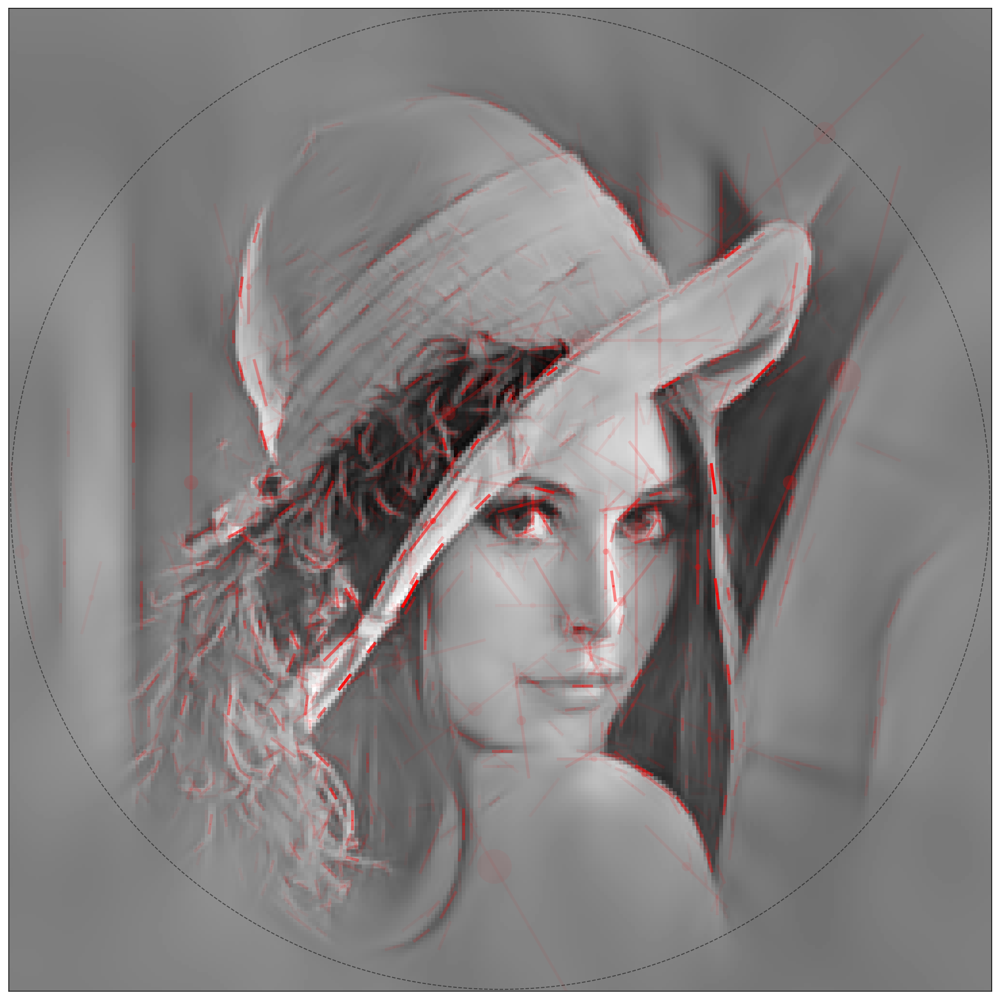

In [43]:
name =  'MPtutorial_lena'

mp = SparseEdges('https://raw.githubusercontent.com/bicv/SparseEdges/master/default_param.py')
mp.pe.N = 2048
mp.pe.MP_alpha = 1.

# defining input image
image = mp.imread('https://raw.githubusercontent.com/bicv/SparseEdges/master/database/lena256.png')
#image = mp.imread('lena256.png')
mp.set_size(image)
mp.init()

white = mp.pipeline(image, do_whitening=True)


try:
    edges = np.load(name + '.npy')
except:
    edges, C_res = mp.run_mp(white, verbose=True)
    np.save(name + '.npy', edges)    

fig_width_pt = 318.670  # Get this from LaTeX using \showthe\columnwidth
inches_per_pt = 1.0/72.27               # Convert pt to inches
fig_width = fig_width_pt*inches_per_pt  # width in inches
mp.pe.figsize_edges = 9 #.382 * fig_width
mp.pe.line_width = 3.
mp.pe.scale = .5

fig, a = mp.show_edges(edges, image=mp.dewhitening(white), show_phase=False, show_mask=True)
#mp.savefig(fig, name)

image_rec = mp.reconstruct(edges, do_mask=False)        
fig, a = mp.show_edges(edges, image=mp.dewhitening(image_rec), show_phase=False, show_mask=True)
#mp.savefig(fig, name + '_rec')        

In [44]:
%cd -q ../files/2015-05-22-a-hitchhiker-guide-to-matching-pursuit/
%run MPtutorial_lena.py
%cd -q ../../posts

## some book keeping for the notebook

In [45]:
%load_ext watermark
%watermark

2018-06-26T12:49:22+02:00

CPython 3.6.5
IPython 6.4.0

compiler   : GCC 4.2.1 Compatible Apple LLVM 9.1.0 (clang-902.0.39.2)
system     : Darwin
release    : 17.6.0
machine    : x86_64
processor  : i386
CPU cores  : 36
interpreter: 64bit


In [46]:
%load_ext version_information
%version_information numpy, scipy, matplotlib

Software versions
Python 3.6.5 64bit [GCC 4.2.1 Compatible Apple LLVM 9.1.0 (clang-902.0.39.2)]
IPython 6.4.0
OS Darwin 17.6.0 x86_64 i386 64bit
numpy 1.14.5
scipy 1.1.0
matplotlib 2.2.2
Tue Jun 26 12:49:23 2018 CEST